# Computer Vision Assignment 1 - Problem Statement 2
# Lane Detection Using Classical Computer Vision and Machine Learning



## Problem Statement

The goal of this assignment is to develop a **robust system for detecting straight lane lines in road images** using purely **classical computer vision** and **Machine Learning (ML)** techniques.

The implementation must rely on concepts of:
- **Edge Detection**
- **Hough Transformation**
- **Data Clustering/Averaging** for line fitting

### Dataset
**Source:** [Lane Detection Road Line Detection Image Dataset](https://www.kaggle.com/datasets/dataclusterlabs/lane-detection-road-line-detection-image-dataset?resource=download)

### Key Requirements
1. Preprocessing: Color space conversion and Gaussian Blurring
2. Edge Detection: Canny Edge Detector
3. Feature Extraction: Region of Interest (ROI) mask
4. Line Parameterization: Hough Transform
5. Machine Learning Filtering: Statistical methods (Averaging/RANSAC/K-Means)

## Table of Contents

1. [Import Required Libraries](#section1) - **(0.5 points)**
2. [Data Acquisition](#section2) - **(0.5 points)**
3. [Data Preparation](#section3) - **(1.0 points)**
4. [Part 1: Preprocessing and Edge Detection](#section4)
5. [Part 2: Hough Transformation](#section5)
6. [Part 3: ML-Based Line Fitting](#section6) - **(2.5 points - Feature Engineering)**
7. [Model Building - Complete Pipeline](#section7) - **(1.5 points)**
8. [Validation Metrics](#section8) - **(0.5 points)**
9. [Model Inference & Evaluation](#section9) - **(1.0 points)**
10. [Validation of Actual Test Image](#section10) - **(1.5 points)**
11. [Analysis & Discussion](#section11) - **(1.0 points)**
12. [Individual Contributions](#section12)

---

## 1 Import Required Libraries

In [1]:
# Core libraries for numerical operations and data handling
import numpy as np                    # For array operations and numerical computations
import pandas as pd                   # For data manipulation and analysis

# Image processing libraries
import cv2                            # OpenCV for computer vision operations
from skimage import io, exposure      # For additional image I/O and preprocessing
from skimage.feature import canny     # Alternative Canny edge detector

# Visualization libraries
import matplotlib.pyplot as plt       # For creating plots and visualizations
import matplotlib.image as mpimg      # For image loading and display
from matplotlib import cm             # For color maps
import seaborn as sns                 # For enhanced statistical visualizations

# Machine Learning libraries
from sklearn.cluster import KMeans, DBSCAN          # For clustering algorithms
from sklearn.linear_model import RANSACRegressor    # For robust line fitting
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix  # For evaluation
from sklearn.metrics import classification_report   # For detailed metrics

# File and system operations
import os                             # For file path operations
import glob                           # For file pattern matching
from pathlib import Path              # For path manipulations
import random                         # For random sampling
import warnings                       # For warning management

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')

# Set matplotlib style for better visualizations
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# Set random seeds for reproducibility
np.random.seed(42)
random.seed(42)

# Configure matplotlib for inline plotting
%matplotlib inline

# Set figure size default
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 100

print("[SUCCESS] All libraries imported successfully!")
print(f"OpenCV version: {cv2.__version__}")
print(f"NumPy version: {np.__version__}")
print(f"Pandas version: {pd.__version__}")

[SUCCESS] All libraries imported successfully!
OpenCV version: 4.12.0
NumPy version: 2.0.2
Pandas version: 2.2.2


<a id='section2'></a>
## 2 Data Acquisition

In [2]:
import os
from pathlib import Path
from google.colab import files

# Check if kaggle.json already exists
kaggle_path = Path.home() / '.kaggle' / 'kaggle.json'

if kaggle_path.exists():
    print("Kaggle API already configured!")
else:
    print("Please upload your kaggle.json file...")

    # Upload kaggle.json
    uploaded = files.upload()

    # Setup Kaggle API
    kaggle_dir = Path.home() / '.kaggle'
    kaggle_dir.mkdir(parents=True, exist_ok=True)

    # Move uploaded file to .kaggle directory
    kaggle_path.write_bytes(Path('kaggle.json').read_bytes())

    # Set appropriate permissions
    kaggle_path.chmod(0o600)

    print("Kaggle API configured!")

Please upload your kaggle.json file...


Saving kaggle.json to kaggle.json
Kaggle API configured!


In [3]:
import kaggle
from pathlib import Path

# Download and extract in one step
DATASET_PATH = './dataset/lane_detection/'
print(f"Downloading and extracting Lane Detection dataset in: {DATASET_PATH}")
kaggle.api.dataset_download_files('dataclusterlabs/lane-detection-road-line-detection-image-dataset', path='./dataset/lane_detection/', unzip=True)

# Display structure
print("\nDataset contents:")
for item in sorted(Path('./dataset/lane_detection/').glob('*')):
    print(f"{'-' if item.is_dir() else '-'} {item.name}")

Dataset URL: https://www.kaggle.com/datasets/dataclusterlabs/lane-detection-road-line-detection-image-dataset

Dataset contents:
- road_line_annotation
- road_line_images


In [4]:
# Load all image paths from the dataset
# Supports common image formats: jpg, jpeg, png
image_extensions = ['*.jpg', '*.jpeg', '*.png', '*.JPG', '*.JPEG', '*.PNG']
image_paths = []

# Collect all image files from dataset directory
for ext in image_extensions:
    image_paths.extend(glob.glob(os.path.join(DATASET_PATH, '**', ext), recursive=True))

# Sort paths for consistency
image_paths.sort()

print(f"Dataset Statistics:")
print(f"   Total images found: {len(image_paths)}")
print(f"\nDataset structure:")
print(f"   Root directory: {DATASET_PATH}")

# Display first few image paths as examples
if len(image_paths) > 0:
    print(f"\nSample image paths (first 5):")
    for i, path in enumerate(image_paths[:5], 1):
        print(f"   {i}. {os.path.basename(path)}")
else:
    print("\nWARNING: No images found! Please check the dataset path.")

Dataset Statistics:
   Total images found: 50

Dataset structure:
   Root directory: ./dataset/lane_detection/

Sample image paths (first 5):
   1. dc_auto_000177_QW8Pqnw0.jpg
   2. dc_auto_000179_MdYqzu93.jpg
   3. dc_auto_000180_WHZmSiVx.jpg
   4. dc_auto_000869_fUaOFIP1.jpg
   5. dc_auto_000874_k9LK0YFB.jpg


### 2.1 Dataset Organization

For this lane detection problem, we'll organize our data as follows:
- **Training Set (80%):** Used for parameter tuning and algorithm development
- **Testing Set (20%):** Used for final evaluation
- **Custom Test Images:** Real-world images we'll create/capture for validation

In [5]:
# Create train-test split (80-20 stratified split as per assignment requirements)
from sklearn.model_selection import train_test_split

# Split the dataset
train_paths, test_paths = train_test_split(
    image_paths,
    test_size=0.2,      # 20% for testing
    random_state=42,    # For reproducibility
    shuffle=True        # Shuffle before splitting
)

print(f"Data Split:")
print(f"   Training images: {len(train_paths)} ({len(train_paths)/len(image_paths)*100:.1f}%)")
print(f"   Testing images:  {len(test_paths)} ({len(test_paths)/len(image_paths)*100:.1f}%)")
print(f"   Total images:    {len(image_paths)}")

Data Split:
   Training images: 40 (80.0%)
   Testing images:  10 (20.0%)
   Total images:    50


###  2.2 Sample Images from Dataset

Let's visualize a few sample images to understand the dataset characteristics:
- Image resolution and aspect ratio
- Road conditions and lane visibility
- Lighting conditions
- Camera angles and perspectives

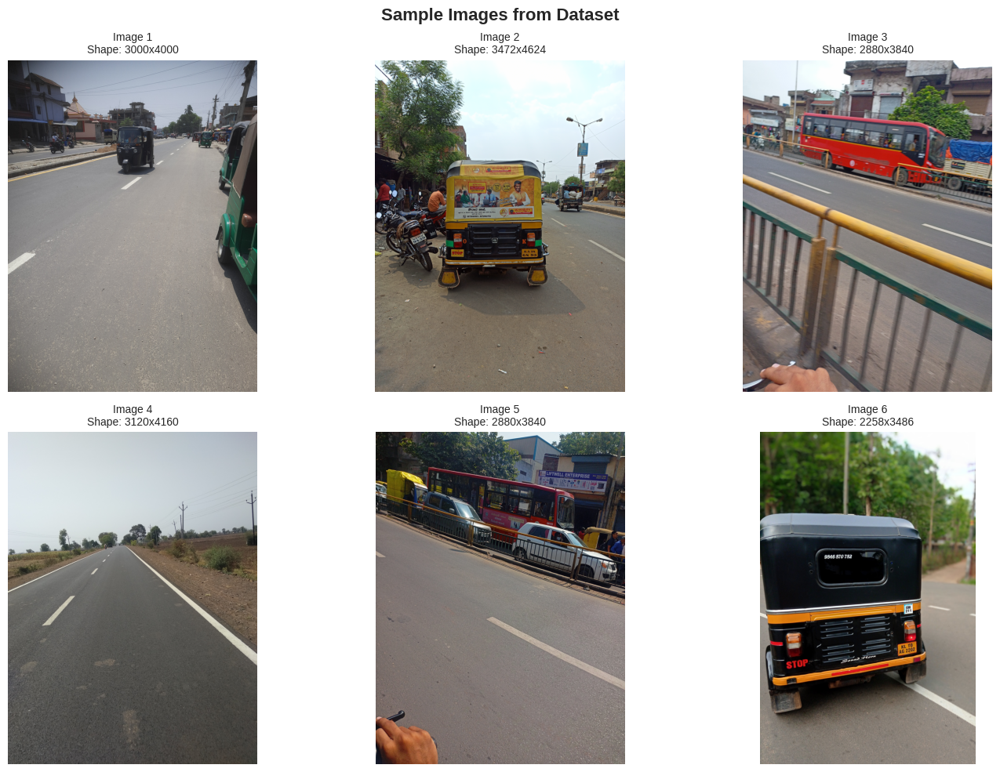

In [6]:
# Visualize sample images from the dataset
num_samples=6
title="Sample Images from Dataset"

# Randomly select sample images
sample_paths = random.sample(train_paths, min(num_samples, len(train_paths)))

# Create subplot grid
rows = 2
cols = 3
fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
fig.suptitle(title, fontsize=16, fontweight='bold')

# Display each image
for idx, (ax, img_path) in enumerate(zip(axes.flat, sample_paths)):
    # Read image using OpenCV (reads in BGR)
    img = cv2.imread(img_path)

    # Convert BGR to RGB for proper display
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Display image
    ax.imshow(img_rgb)
    ax.set_title(f"Image {idx+1}\nShape: {img.shape[1]}x{img.shape[0]}", fontsize=10)
    ax.axis('off')

plt.tight_layout()
plt.show()

### 2.3 Data Distribution Visualization

- Image resolution distribution
- File size distribution
- Image format distribution

Analyzing dataset properties...


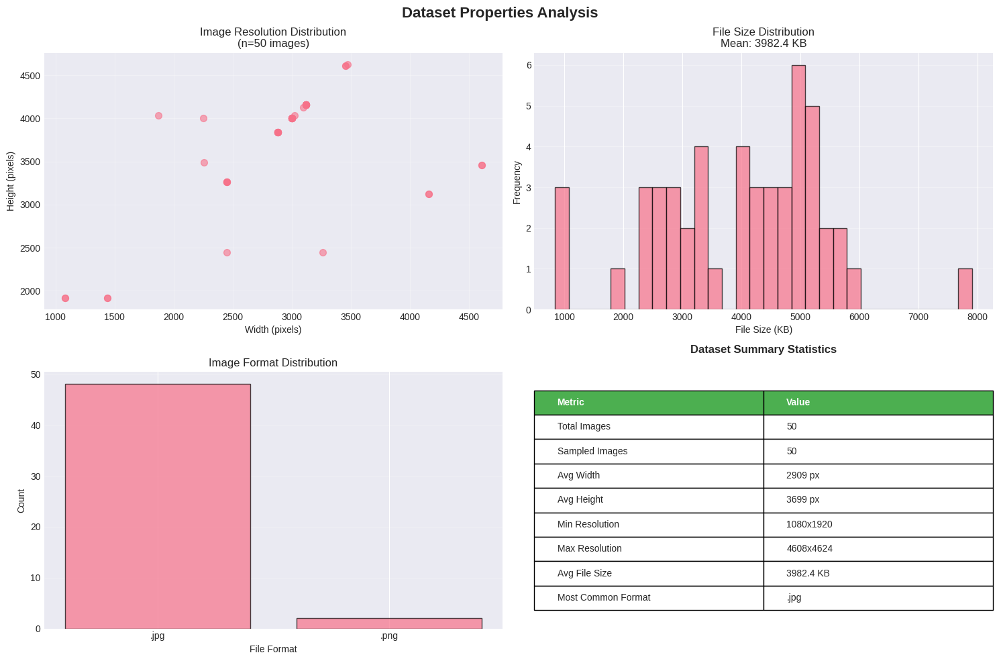


[SUCCESS] Dataset analysis complete!


In [7]:
sample_size=100

# Sample images for analysis
sample_paths = random.sample(image_paths, min(sample_size, len(image_paths)))

widths = []
heights = []
file_sizes = []
formats = []

print("Analyzing dataset properties...")

for img_path in sample_paths:
    # Get image dimensions
    img = cv2.imread(img_path)
    if img is not None:
        h, w = img.shape[:2]
        widths.append(w)
        heights.append(h)

    # Get file size (in KB)
    file_size = os.path.getsize(img_path) / 1024  # Convert to KB
    file_sizes.append(file_size)

    # Get file format
    ext = os.path.splitext(img_path)[1].lower()
    formats.append(ext)

# Create visualizations
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('Dataset Properties Analysis', fontsize=16, fontweight='bold')

# 1. Resolution distribution
axes[0, 0].scatter(widths, heights, alpha=0.6, s=50)
axes[0, 0].set_xlabel('Width (pixels)')
axes[0, 0].set_ylabel('Height (pixels)')
axes[0, 0].set_title(f'Image Resolution Distribution\n(n={len(widths)} images)')
axes[0, 0].grid(True, alpha=0.3)

# 2. File size distribution
axes[0, 1].hist(file_sizes, bins=30, edgecolor='black', alpha=0.7)
axes[0, 1].set_xlabel('File Size (KB)')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].set_title(f'File Size Distribution\nMean: {np.mean(file_sizes):.1f} KB')
axes[0, 1].grid(True, alpha=0.3, axis='y')

# 3. Format distribution
format_counts = pd.Series(formats).value_counts()
axes[1, 0].bar(format_counts.index, format_counts.values, edgecolor='black', alpha=0.7)
axes[1, 0].set_xlabel('File Format')
axes[1, 0].set_ylabel('Count')
axes[1, 0].set_title('Image Format Distribution')
axes[1, 0].grid(True, alpha=0.3, axis='y')

# 4. Summary statistics table
axes[1, 1].axis('off')
summary_data = [
    ['Metric', 'Value'],
    ['Total Images', f"{len(image_paths)}"],
    ['Sampled Images', f"{len(sample_paths)}"],
    ['Avg Width', f"{np.mean(widths):.0f} px"],
    ['Avg Height', f"{np.mean(heights):.0f} px"],
    ['Min Resolution', f"{min(widths)}x{min(heights)}"],
    ['Max Resolution', f"{max(widths)}x{max(heights)}"],
    ['Avg File Size', f"{np.mean(file_sizes):.1f} KB"],
    ['Most Common Format', f"{format_counts.index[0]}"]
]

table = axes[1, 1].table(cellText=summary_data, cellLoc='left',
                        loc='center', colWidths=[0.5, 0.5])
table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1, 2)

# Style header row
for i in range(2):
    table[(0, i)].set_facecolor('#4CAF50')
    table[(0, i)].set_text_props(weight='bold', color='white')

axes[1, 1].set_title('Dataset Summary Statistics', fontweight='bold', pad=20)

plt.tight_layout()
plt.show()

dataset_stats = {
    'widths': widths,
    'heights': heights,
    'file_sizes': file_sizes,
    'formats': formats
}

print("\n[SUCCESS] Dataset analysis complete!")

## 3 Data Preparation

### Preprocessing Overview

For lane detection, we need to prepare images through several preprocessing steps:
1. **Resize images** to a standard size for consistent processing
2. **Color space conversion** (RGB to Grayscale, HLS, or HSV)
3. **Histogram equalization** to improve contrast
4. **Gaussian blur** to reduce noise
5. **Normalization** for consistent pixel value ranges

These preprocessing steps ensure that our edge detection and line detection algorithms work effectively across various lighting conditions and image qualities.

### 3.1 Define Standard Image Dimensions

We'll standardize all images to a consistent size for efficient processing.

**Common choices for lane detection:**
- **640x360** - Faster processing, lower detail
- **960x540** - Good balance
- **1280x720** - More detail, slower processing

**960x540 Trial - Error**

1. **Detail Preservation:**
   - Maintains 16:9 aspect ratio (standard for dashcam footage)
   - Resolution is high enough to preserve lane line features and edges
   - Sufficient pixel density for accurate Canny edge detection

2. **Processing Speed:**
   - Smaller than typical HD (1920x1080), reducing computational load by 75%
   - Faster Hough Transform computation (fewer pixels to process)
   - Enables real-time or near-real-time processing on standard hardware

3. **Memory Efficiency:**
   - 518,400 pixels per image (vs 2,073,600 for Full HD)
   - Lower memory footprint for batch processing
   - Allows processing larger batches without memory overflow

4. **Feature Detection:**
   - Lane lines are typically thick and high-contrast, don't need full HD
   - Edge detection algorithms work effectively at this resolution
   - ROI (Region of Interest) masking remains precise

In [8]:
# Load sample images for testing the pipeline
# Select 5 random images from training set for pipeline testing
import random
random.seed(42)  # For reproducibility

num_test_images = 5
test_image_paths = random.sample(train_paths, min(num_test_images, len(train_paths)))

# Load and resize sample images
sample_images = []
TARGET_WIDTH, TARGET_HEIGHT = 960, 540  # Standard dimensions

for img_path in test_image_paths:
    img = cv2.imread(img_path)
    if img is not None:
        # Resize to standard dimensions
        resized = cv2.resize(img, (TARGET_WIDTH, TARGET_HEIGHT), interpolation=cv2.INTER_AREA)
        sample_images.append(resized)

print(f"Loaded {len(sample_images)} sample images for testing")
print(f"Image dimensions: {TARGET_WIDTH}x{TARGET_HEIGHT}")


Loaded 5 sample images for testing
Image dimensions: 960x540


In [9]:
# Define standard image dimensions for processing
# Using 960x540 provides good balance between detail preservation and processing speed
IMG_WIDTH = 960
IMG_HEIGHT = 540

# Alternative smaller size for faster processing: 640x360
# IMG_WIDTH = 640
# IMG_HEIGHT = 360

print(f"Standard image dimensions set to: {IMG_WIDTH}x{IMG_HEIGHT}")
print(f"Aspect ratio: {IMG_WIDTH/IMG_HEIGHT:.2f}:1")

Standard image dimensions set to: 960x540
Aspect ratio: 1.78:1


### 3.2 Load Sample Image for Preprocessing

Load a sample image from the training set to demonstrate the preprocessing pipeline.

In [10]:
# Load a sample image to demonstrate preprocessing
print("Loading sample image for preprocessing demonstration...")

# Select first image from training set
sample_img_path = train_paths[0]

# Read the image in BGR format (OpenCV default)
original_img = cv2.imread(sample_img_path)

# Resize to standard dimensions
resized_img = cv2.resize(original_img, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_LINEAR)

print(f"Sample image loaded: {os.path.basename(sample_img_path)}")
print(f"Original shape: {original_img.shape} (Height x Width x Channels)")
print(f"Resized shape: {resized_img.shape} (Height x Width x Channels)")
print(f"\nPreprocessing pipeline ready!")

Loading sample image for preprocessing demonstration...
Sample image loaded: dc_auto_image_000745_FtBnJ6AqNf.jpg
Original shape: (2448, 2448, 3) (Height x Width x Channels)
Resized shape: (540, 960, 3) (Height x Width x Channels)

Preprocessing pipeline ready!


### 3.3 Grayscale Conversion

Converting to grayscale simplifies the image from 3 channels (RGB) to 1 channel, reducing computational complexity while preserving edge information needed for lane detection.

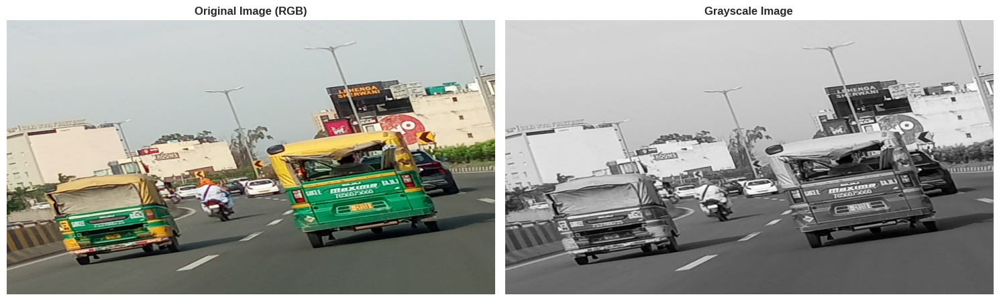

Original shape: (540, 960, 3) (Height x Width x Channels)
Grayscale shape: (540, 960) (Height x Width)
Memory reduction: 66.7%


In [11]:
# Grayscale Conversion - Convert BGR to Grayscale
gray_img = cv2.cvtColor(resized_img, cv2.COLOR_BGR2GRAY)

# Display comparison
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Original image (convert BGR to RGB for display)
axes[0].imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image (RGB)', fontsize=12, fontweight='bold')
axes[0].axis('off')

# Grayscale image
axes[1].imshow(gray_img, cmap='gray')
axes[1].set_title('Grayscale Image', fontsize=12, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.show()

print(f"Original shape: {resized_img.shape} (Height x Width x Channels)")
print(f"Grayscale shape: {gray_img.shape} (Height x Width)")
print(f"Memory reduction: {(1 - gray_img.nbytes/resized_img.nbytes)*100:.1f}%")

### 3.4 Color Space Conversion (HLS and HSV)

**HLS (Hue, Lightness, Saturation)** and **HSV (Hue, Saturation, Value)** color spaces are better for detecting colored lane lines (white and yellow) under varying lighting conditions compared to RGB.

- **L-channel (HLS):** Represents lightness, good for detecting white lines
- **S-channel (HLS/HSV):** Represents saturation, useful for detecting yellow lines
- **V-channel (HSV):** Represents brightness/value, alternative for white line detection

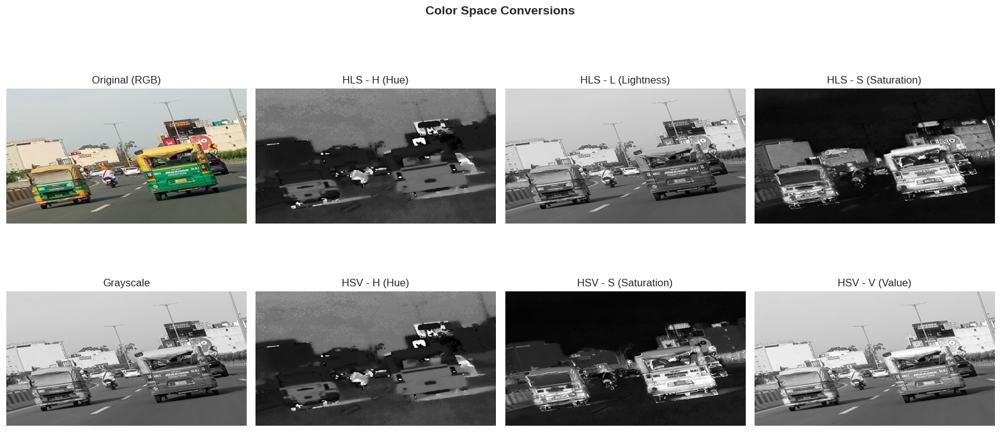

Key observations:
- L-channel (HLS) and V-channel (HSV) are good for white line detection
- S-channel (HLS/HSV) helps detect yellow lines
- These channels are more robust to lighting variations than RGB


In [12]:
# Color Space Conversion to HLS and HSV

# Convert BGR to HLS
hls_img = cv2.cvtColor(resized_img, cv2.COLOR_BGR2HLS)
# Extract individual channels from HLS
h_hls, l_hls, s_hls = cv2.split(hls_img)

# Convert BGR to HSV
hsv_img = cv2.cvtColor(resized_img, cv2.COLOR_BGR2HSV)
# Extract individual channels from HSV
h_hsv, s_hsv, v_hsv = cv2.split(hsv_img)

# Display all channels
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
fig.suptitle('Color Space Conversions', fontsize=14, fontweight='bold')

# Original image
axes[0, 0].imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Original (RGB)')
axes[0, 0].axis('off')

# HLS channels
axes[0, 1].imshow(h_hls, cmap='gray')
axes[0, 1].set_title('HLS - H (Hue)')
axes[0, 1].axis('off')

axes[0, 2].imshow(l_hls, cmap='gray')
axes[0, 2].set_title('HLS - L (Lightness)')
axes[0, 2].axis('off')

axes[0, 3].imshow(s_hls, cmap='gray')
axes[0, 3].set_title('HLS - S (Saturation)')
axes[0, 3].axis('off')

# Grayscale
axes[1, 0].imshow(gray_img, cmap='gray')
axes[1, 0].set_title('Grayscale')
axes[1, 0].axis('off')

# HSV channels
axes[1, 1].imshow(h_hsv, cmap='gray')
axes[1, 1].set_title('HSV - H (Hue)')
axes[1, 1].axis('off')

axes[1, 2].imshow(s_hsv, cmap='gray')
axes[1, 2].set_title('HSV - S (Saturation)')
axes[1, 2].axis('off')

axes[1, 3].imshow(v_hsv, cmap='gray')
axes[1, 3].set_title('HSV - V (Value)')
axes[1, 3].axis('off')

plt.tight_layout()
plt.show()

print("Key observations:")
print("- L-channel (HLS) and V-channel (HSV) are good for white line detection")
print("- S-channel (HLS/HSV) helps detect yellow lines")
print("- These channels are more robust to lighting variations than RGB")

### 3.5 Histogram Equalization and CLAHE

**Histogram Equalization** improves contrast by redistributing pixel intensities across the full range.<br>**CLAHE (Contrast Limited Adaptive Histogram Equalization)** prevents over-amplification of noise by limiting contrast enhancement locally.

This is crucial for handling images with varying lighting conditions (shadows, bright sunlight, etc.).

**CLAHE Parameters:**
- `clipLimit`: Threshold for contrast limiting (higher = more contrast)
- `tileGridSize`: Size of grid for local histogram equalization

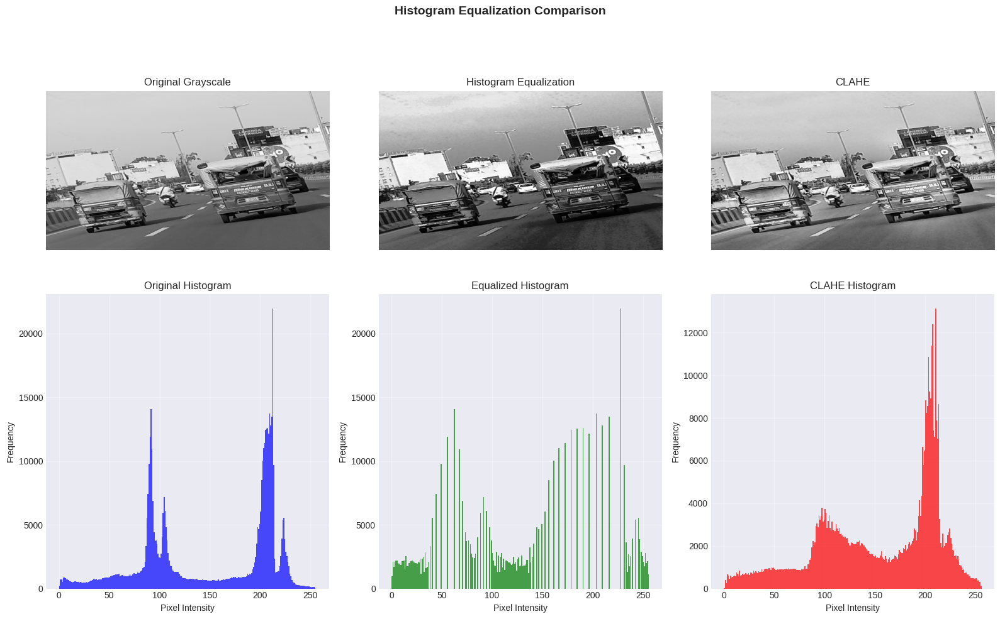

Observations:
- Standard equalization spreads pixel intensities across full range
- CLAHE provides better local contrast without over-amplifying noise
- CLAHE is preferred for lane detection as it handles varying lighting better


In [13]:
# Histogram Equalization and CLAHE

# Apply standard histogram equalization
equalized_img = cv2.equalizeHist(gray_img)

# Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)
# clipLimit: Threshold for contrast limiting (higher = more contrast)
# tileGridSize: Size of grid for local histogram equalization
clahe = cv2.createCLAHE(clipLimit=2.5, tileGridSize=(8, 8))
clahe_img = clahe.apply(gray_img)

# Display comparisons with histograms
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle('Histogram Equalization Comparison', fontsize=14, fontweight='bold')

# Original grayscale
axes[0, 0].imshow(gray_img, cmap='gray')
axes[0, 0].set_title('Original Grayscale')
axes[0, 0].axis('off')

# Standard equalization
axes[0, 1].imshow(equalized_img, cmap='gray')
axes[0, 1].set_title('Histogram Equalization')
axes[0, 1].axis('off')

# CLAHE
axes[0, 2].imshow(clahe_img, cmap='gray')
axes[0, 2].set_title('CLAHE')
axes[0, 2].axis('off')

# Histograms
axes[1, 0].hist(gray_img.ravel(), bins=256, range=[0, 256], color='blue', alpha=0.7)
axes[1, 0].set_title('Original Histogram')
axes[1, 0].set_xlabel('Pixel Intensity')
axes[1, 0].set_ylabel('Frequency')
axes[1, 0].grid(True, alpha=0.3)

axes[1, 1].hist(equalized_img.ravel(), bins=256, range=[0, 256], color='green', alpha=0.7)
axes[1, 1].set_title('Equalized Histogram')
axes[1, 1].set_xlabel('Pixel Intensity')
axes[1, 1].set_ylabel('Frequency')
axes[1, 1].grid(True, alpha=0.3)

axes[1, 2].hist(clahe_img.ravel(), bins=256, range=[0, 256], color='red', alpha=0.7)
axes[1, 2].set_title('CLAHE Histogram')
axes[1, 2].set_xlabel('Pixel Intensity')
axes[1, 2].set_ylabel('Frequency')
axes[1, 2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("Observations:")
print("- Standard equalization spreads pixel intensities across full range")
print("- CLAHE provides better local contrast without over-amplifying noise")
print("- CLAHE is preferred for lane detection as it handles varying lighting better")

### 3.6 Gaussian Blur

**Gaussian Blur** reduces image noise and smooths the image before edge detection. This helps reduce false edges from noise while preserving true edges.

The kernel size determines the amount of blurring:
- Smaller kernel (3x3): Minimal smoothing, preserves details
- Medium kernel (5x5): Good balance (Good for lane detection)
- Larger kernel (7x7): Heavy smoothing, may lose edge details

**Note:** Kernel size must be odd numbers (3x3, 5x5, 7x7, etc.)

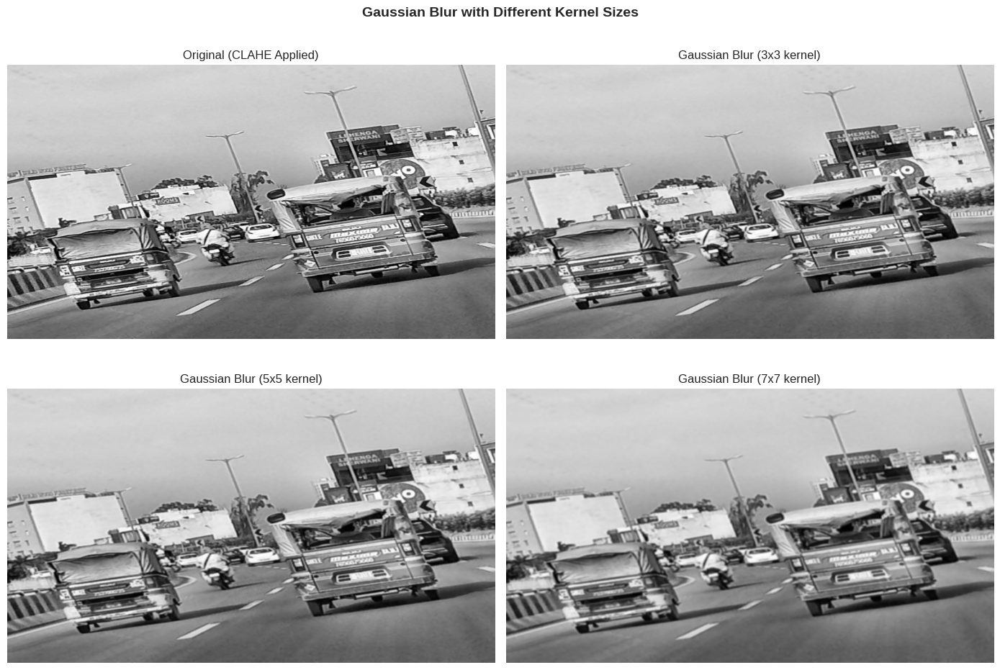

Kernel Size Selection:
- 3x3: Minimal smoothing, preserves most details
- 5x5: Good balance between noise reduction and edge preservation
- 7x7: Heavy smoothing, may lose some edge details

For lane detection, 5x5 kernel is typically optimal


In [14]:
# Gaussian Blur
# Kernel size must be odd numbers (3x3, 5x5, 7x7, etc.)

# Apply Gaussian blur with different kernel sizes
blur_3x3 = cv2.GaussianBlur(clahe_img, (3, 3), 0)
blur_5x5 = cv2.GaussianBlur(clahe_img, (5, 5), 0)
blur_7x7 = cv2.GaussianBlur(clahe_img, (7, 7), 0)

# Display comparison
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Gaussian Blur with Different Kernel Sizes', fontsize=14, fontweight='bold')

# Original (CLAHE applied)
axes[0, 0].imshow(clahe_img, cmap='gray')
axes[0, 0].set_title('Original (CLAHE Applied)')
axes[0, 0].axis('off')

# 3x3 kernel
axes[0, 1].imshow(blur_3x3, cmap='gray')
axes[0, 1].set_title('Gaussian Blur (3x3 kernel)')
axes[0, 1].axis('off')

# 5x5 kernel
axes[1, 0].imshow(blur_5x5, cmap='gray')
axes[1, 0].set_title('Gaussian Blur (5x5 kernel)')
axes[1, 0].axis('off')

# 7x7 kernel
axes[1, 1].imshow(blur_7x7, cmap='gray')
axes[1, 1].set_title('Gaussian Blur (7x7 kernel)')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

print("Kernel Size Selection:")
print("- 3x3: Minimal smoothing, preserves most details")
print("- 5x5: Good balance between noise reduction and edge preservation")
print("- 7x7: Heavy smoothing, may lose some edge details")
print("\nFor lane detection, 5x5 kernel is typically optimal")

# Store the best preprocessed image for future use
preprocessed_gray = blur_5x5

### 3.7 Complete Preprocessing Pipeline Summary

Let's visualize the complete preprocessing pipeline from original image to final preprocessed image ready for edge detection.

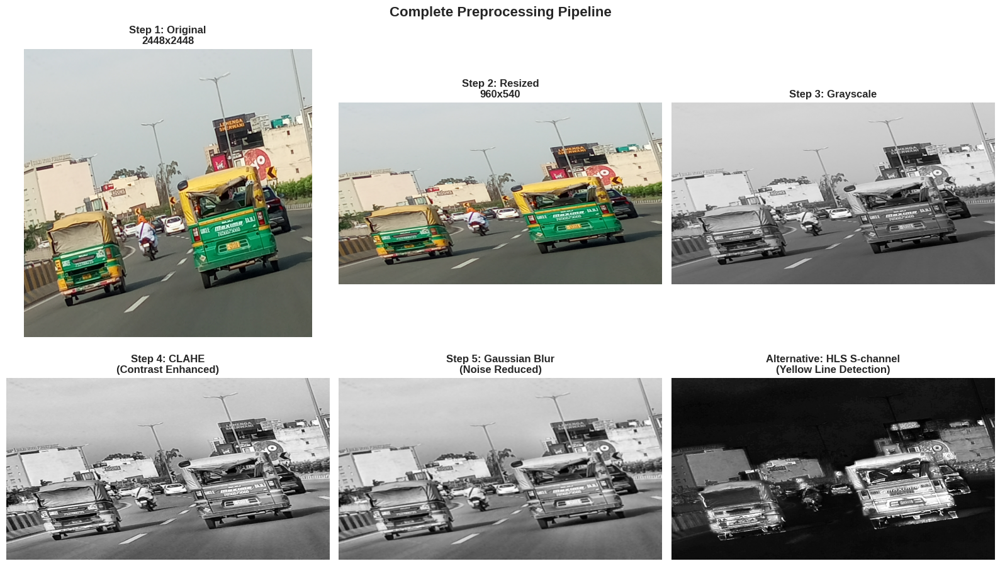

PREPROCESSING PIPELINE SUMMARY
1. Resize: (2448, 2448, 3) -> (540, 960, 3)
2. Grayscale Conversion: 3 channels -> 1 channel
3. CLAHE: clipLimit=2.0, tileGridSize=(8,8)
4. Gaussian Blur: kernel=(5,5)
5. Ready for Edge Detection!


In [15]:
# Complete Preprocessing Pipeline Comparison

# Create a comprehensive comparison of the preprocessing steps
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle('Complete Preprocessing Pipeline', fontsize=16, fontweight='bold')

# Step 1: Original Image
axes[0, 0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title(f'Step 1: Original\n{original_img.shape[1]}x{original_img.shape[0]}', fontweight='bold')
axes[0, 0].axis('off')

# Step 2: Resized
axes[0, 1].imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title(f'Step 2: Resized\n{resized_img.shape[1]}x{resized_img.shape[0]}', fontweight='bold')
axes[0, 1].axis('off')

# Step 3: Grayscale
axes[0, 2].imshow(gray_img, cmap='gray')
axes[0, 2].set_title('Step 3: Grayscale', fontweight='bold')
axes[0, 2].axis('off')

# Step 4: CLAHE
axes[1, 0].imshow(clahe_img, cmap='gray')
axes[1, 0].set_title('Step 4: CLAHE\n(Contrast Enhanced)', fontweight='bold')
axes[1, 0].axis('off')

# Step 5: Gaussian Blur
axes[1, 1].imshow(preprocessed_gray, cmap='gray')
axes[1, 1].set_title('Step 5: Gaussian Blur\n(Noise Reduced)', fontweight='bold')
axes[1, 1].axis('off')

# Step 6: HLS S-channel (for color-based detection)
axes[1, 2].imshow(s_hls, cmap='gray')
axes[1, 2].set_title('Alternative: HLS S-channel\n(Yellow Line Detection)', fontweight='bold')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

# Print pipeline summary
print("PREPROCESSING PIPELINE SUMMARY")
print(f"1. Resize: {original_img.shape} -> {resized_img.shape}")
print(f"2. Grayscale Conversion: 3 channels -> 1 channel")
print(f"3. CLAHE: clipLimit=2.0, tileGridSize=(8,8)")
print(f"4. Gaussian Blur: kernel=(5,5)")
print(f"5. Ready for Edge Detection!")

<a id='section4'></a>
## Part 2: Preprocessing and Edge Detection

### Key Steps:
1. **Canny Edge Detection** - Detect edges using optimal threshold values
2. **Region of Interest (ROI)** - Define and apply a trapezoidal mask
3. **Masked Edge Detection** - Combine edge detection with ROI for focused analysis

---

### 4.1 Canny Edge Detection - Theory and Implementation

**Canny Edge Detection** is a multi-stage optimal edge detection algorithm that has several characteristics that make Canny edge detection ideal:
1. **High contrast**: White/yellow lines on dark asphalt create strong intensity gradients
2. **Clear boundaries**: Lane markings have well-defined edges
3. **Noise robustness**: Road images often contain texture noise that Canny handles well
4. **Thin edges**: Canny produces single-pixel-wide edges, perfect for line detection

---

#### The Canny Algorithm - 5 Stages

**Stage 1: Noise Reduction (Gaussian Smoothing)**
- Apply Gaussian filter to remove noise
- Reduces false edges from sensor noise and image compression artifacts

**Stage 2: Gradient Calculation (Sobel Operators)**
- Compute intensity gradients in x and y directions using Sobel kernels

**Stage 3: Non-Maximum Suppression**
- Thin edges to single-pixel width
- For each pixel, compare gradient magnitude with neighbors along gradient direction
- Keep pixel only if it's a local maximum
- **Result**: Sharp, thin edges instead of thick blurry edges

**Stage 4: Double Thresholding**
- Apply two thresholds: τ_high and τ_low
- Classify pixels into three categories:
  - **Strong edges**: G > τ_high (definitely keep)
  - **Weak edges**: τ_low < G < τ_high (maybe keep)
  - **Non-edges**: G < τ_low (definitely discard)

**Stage 5: Edge Tracking by Hysteresis**
- Start with strong edge pixels
- Recursively follow connected weak edge pixels
- Weak edges connected to strong edges are promoted to strong
- Isolated weak edges are discarded
- **Result**: Connected edge contours with gaps filled

---

#### Key Parameters - Threshold Selection

**τ_low (threshold1):** Lower threshold
- Too low: Detects noise as edges
- Too high: Misses faint but genuine edges

**τ_high (threshold2):** Upper threshold
- Too low: Too many false positives
- Too high: Misses edges, breaks edge contours

**Optimal Ratio:** τ_high : τ_low = **2:1 to 3:1**
- John Canny using 3:1 ratio

**Threshold Selection Strategy:**

| Threshold Pair | Use Case | Advantages |
|---------------|----------|------------|
| **(30, 90)** | Very faint lines, low contrast | Detects weak edges |
| **(50, 100)** | Low-medium contrast | Good sensitivity |
| **(50, 150)** | **We are Using** for lane detection | Balanced detection, good SNR |
| **(100, 200)** | High contrast, clean conditions | Clean output, few false positives |

---

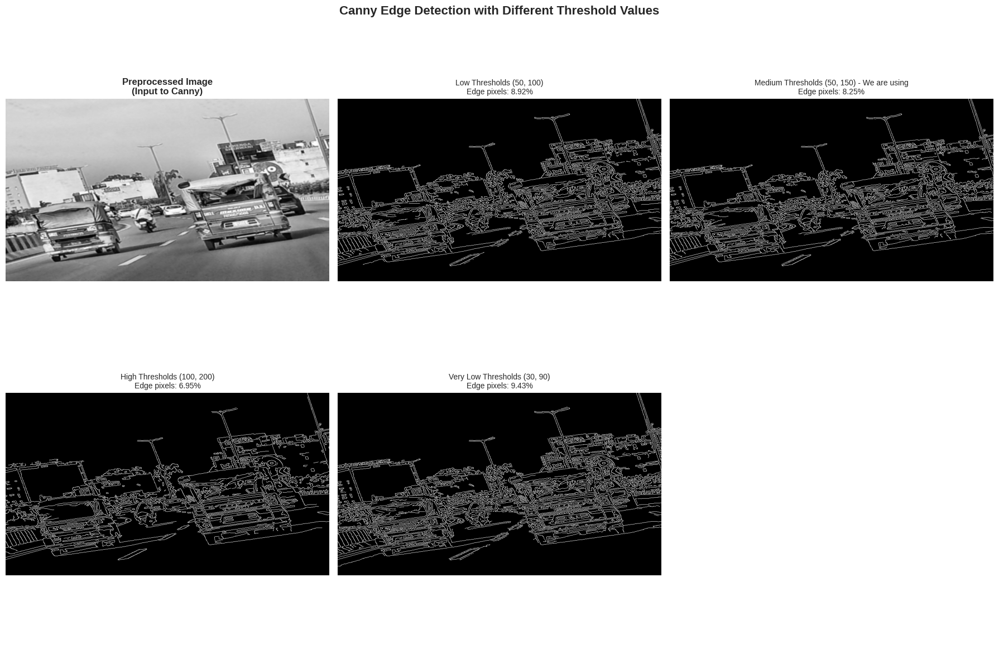

Selected Optimal Canny Parameters:
   τ_low (threshold1): 50
   τ_high (threshold2): 150
   Ratio (τ_high/τ_low): 3.0:1

Edge Detection Complete!


In [16]:
# Canny Edge Detection with Different Threshold Values

# Test different threshold combinations
threshold_configs = [
    (50, 100, "Low Thresholds (50, 100)"),
    (50, 150, "Medium Thresholds (50, 150) - We are using"),
    (100, 200, "High Thresholds (100, 200)"),
    (30, 90, "Very Low Thresholds (30, 90)")
]

# Apply Canny edge detection with different thresholds
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('Canny Edge Detection with Different Threshold Values', fontsize=16, fontweight='bold')

# Display preprocessed image
axes[0, 0].imshow(preprocessed_gray, cmap='gray')
axes[0, 0].set_title('Preprocessed Image\n(Input to Canny)', fontweight='bold')
axes[0, 0].axis('off')

# Apply Canny with different thresholds
canny_results = []
for idx, (low, high, title) in enumerate(threshold_configs):
    edges = cv2.Canny(preprocessed_gray, low, high)
    canny_results.append((low, high, edges))

    # Calculate edge pixel percentage
    edge_percentage = (np.sum(edges > 0) / edges.size) * 100

    # Determine subplot position (skip first position as it's the input image)
    if idx < 2:
        row, col = 0, idx + 1
    else:
        row, col = 1, idx - 2

    axes[row, col].imshow(edges, cmap='gray')
    axes[row, col].set_title(f'{title}\nEdge pixels: {edge_percentage:.2f}%', fontsize=10)
    axes[row, col].axis('off')

# Hide the last subplot if not used
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

# Select the best threshold configuration (medium thresholds)
CANNY_LOW = 50
CANNY_HIGH = 150
edges_optimal = cv2.Canny(preprocessed_gray, CANNY_LOW, CANNY_HIGH)

print(f"Selected Optimal Canny Parameters:")
print(f"   τ_low (threshold1): {CANNY_LOW}")
print(f"   τ_high (threshold2): {CANNY_HIGH}")
print(f"   Ratio (τ_high/τ_low): {CANNY_HIGH/CANNY_LOW:.1f}:1")
print(f"\nEdge Detection Complete!")

### 4.2 Region of Interest (ROI) Mask

**Region of Interest (ROI)** is a spatial filtering technique that isolates the relevant area of an image for processing. For lane detection, ROI focuses computation on the road surface where lane lines appear, dramatically improving both efficiency and accuracy.

---

#### ROI Geometry - The Trapezoidal Mask

Due to perspective projection, parallel lane lines appear to converge toward a vanishing point on the horizon. The road surface forms a **trapezoidal region** in the image:

```
              (Vanishing Point)
                    /\
                   /  \          ← Top edge (narrow, far from camera)
                  /    \
                 /      \
                /        \
               /          \
              /            \
             /______________\    ← Bottom edge (wide, close to camera)
          
         Image Top (sky, horizon)
                 ↓
         ROI Top (road begins here)
                 ↓
         ROI Bottom (camera position)
                 ↓
         Image Bottom
```

**Geometric Properties:**
1. **Bottom width** (W_bottom): 90-100% of image width
   - Lanes are widest at bottom (closest to vehicle)
   - Captures both left and right lane boundaries
   
2. **Top width** (W_top): 5-15% of image width
   - Lanes converge toward vanishing point
   - Centered on image centerline
   - Narrow enough to exclude roadside objects
   
3. **Height**: 35-45% of image height (lower portion)
   - Top boundary: Approximately at horizon line (~60% from top)
   - Bottom boundary: Near image bottom (~98% from top)
   - Excludes sky and distant road portions

---

#### Mathematical Formulation

**Mask Creation:**
1. Initialize zero matrix: M(x,y) = 0 for all pixels
2. Fill polygon: M(x,y) = 255 for (x,y) ∈ Trapezoid
3. Apply mask: I'(x,y) = I(x,y) AND M(x,y)

**Binary Operation:**
```
Masked_Image = Original_Image ⊙ ROI_Mask
```
where ⊙ is element-wise AND operation

---

#### ROI Parameter Selection Guidelines

**Camera Mount Position Considerations:**

| Camera Height | Horizon Line Position | Top Y Ratio | Reasoning |
|--------------|----------------------|-------------|-----------|
| Low (sedan) | 55-60% from top | 0.55-0.60 | More road visible, lower horizon |
| Medium (SUV) | 60-65% from top | 0.60-0.65 | Standard dashcam position |
| High (truck) | 65-70% from top | 0.65-0.70 | Less road visible, higher viewpoint |

**Lane Width Adaptation:**

| Road Type | Bottom Width Ratio | Top Width Ratio | Notes |
|-----------|-------------------|-----------------|-------|
| Highway | 0.90-0.95 | 0.06-0.08 | Wide lanes, gentle curves |
| City street | 0.85-0.90 | 0.08-0.12 | Narrower lanes, sharper turns |
| Single lane | 0.70-0.80 | 0.10-0.15 | Focus on single lane boundaries |

---

In [17]:
# Define Region of Interest (ROI) Function

def create_roi_mask(image, vertices):
    """
    Creates a binary mask for the Region of Interest (ROI).
    mask: Binary mask with 255 inside ROI, 0 outside
    """
    # Create a blank mask
    mask = np.zeros_like(image)

    # Fill the polygon defined by vertices with white (255)
    cv2.fillPoly(mask, vertices, 255)

    return mask


def apply_roi_mask(image, mask):
    """
    Applies the ROI mask to an image using bitwise AND operation.
    masked_image: Image with ROI applied (pixels outside ROI are black)
    """
    return cv2.bitwise_and(image, mask)


# Define ROI vertices for trapezoidal mask
# Coordinates are (x, y) where origin (0,0) is top-left
height, width = preprocessed_gray.shape

# ROI parameters (adjustable for different scenarios)
bottom_width_ratio = 0.95  # 95% of image width at bottom
top_width_ratio = 0.08     # 8% of image width at top
top_y_ratio = 0.60         # Top edge at 60% of image height
bottom_y_ratio = 0.98      # Bottom edge at 98% of image height

# Calculate vertices
bottom_left = (int(width * (1 - bottom_width_ratio) / 2), int(height * bottom_y_ratio))
bottom_right = (int(width * (1 + bottom_width_ratio) / 2), int(height * bottom_y_ratio))
top_left = (int(width * (1 - top_width_ratio) / 2), int(height * top_y_ratio))
top_right = (int(width * (1 + top_width_ratio) / 2), int(height * top_y_ratio))

# Create vertices array (must be in correct order for polygon)
roi_vertices = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)

print(f"ROI Mask Parameters:")
print(f"   Image dimensions: {width}x{height}")
print(f"   Bottom width: {bottom_width_ratio*100:.0f}% ({bottom_right[0] - bottom_left[0]} pixels)")
print(f"   Top width: {top_width_ratio*100:.0f}% ({top_right[0] - top_left[0]} pixels)")
print(f"   Vertices:")
print(f"      Bottom-left: {bottom_left}")
print(f"      Top-left: {top_left}")
print(f"      Top-right: {top_right}")
print(f"      Bottom-right: {bottom_right}")
print(f"\nROI mask created successfully!")

ROI Mask Parameters:
   Image dimensions: 960x540
   Bottom width: 95% (912 pixels)
   Top width: 8% (77 pixels)
   Vertices:
      Bottom-left: (24, 529)
      Top-left: (441, 324)
      Top-right: (518, 324)
      Bottom-right: (936, 529)

ROI mask created successfully!


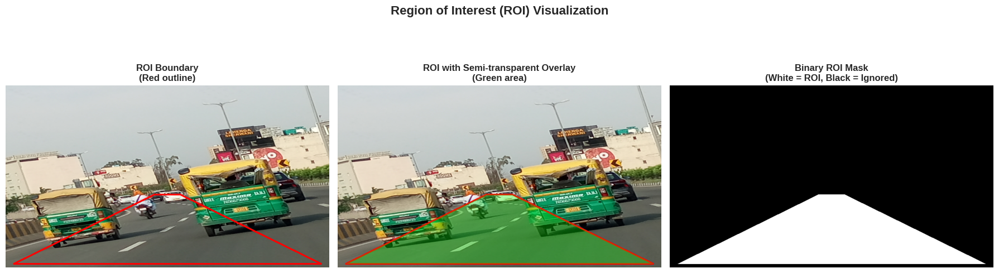

ROI Visualization Complete!
ROI area covers 19.7% of the image


In [18]:
# Visualize ROI Mask on Original Image

# Create ROI mask
roi_mask = create_roi_mask(preprocessed_gray, roi_vertices)

# Create a colored version of the original image for visualization
img_with_roi = cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB).copy()

# Draw ROI polygon on the image
cv2.polylines(img_with_roi, roi_vertices, isClosed=True, color=(255, 0, 0), thickness=3)

# Create a semi-transparent overlay
overlay = img_with_roi.copy()
cv2.fillPoly(overlay, roi_vertices, (0, 255, 0))
img_with_roi_overlay = cv2.addWeighted(img_with_roi, 0.7, overlay, 0.3, 0)

# Display visualizations
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Region of Interest (ROI) Visualization', fontsize=16, fontweight='bold')

# Original image with ROI boundary
axes[0].imshow(img_with_roi)
axes[0].set_title('ROI Boundary\n(Red outline)', fontweight='bold')
axes[0].axis('off')

# Original image with ROI overlay
axes[1].imshow(img_with_roi_overlay)
axes[1].set_title('ROI with Semi-transparent Overlay\n(Green area)', fontweight='bold')
axes[1].axis('off')

# ROI mask (binary)
axes[2].imshow(roi_mask, cmap='gray')
axes[2].set_title('Binary ROI Mask\n(White = ROI, Black = Ignored)', fontweight='bold')
axes[2].axis('off')

plt.tight_layout()
plt.show()

print("ROI Visualization Complete!")
print(f"ROI area covers {np.sum(roi_mask > 0) / roi_mask.size * 100:.1f}% of the image")


### 4.3 Apply ROI Mask to Edge-Detected Image

Now we'll combine the Canny edge detection with the ROI mask to extract only the edges within our region of interest. This is the final preprocessed output that will be fed to the Hough Transform.

---

#### Quality Metrics

**1. Edge Density:**
```
Density = (Number of edge pixels) / (Total pixels in ROI)
```

**2. Edge Reduction Rate:**
```
Reduction = 1 - (E_roi / E_total)
```

**3. Signal-to-Noise Ratio (SNR):**
```
SNR = (Lane edge pixels) / (Non-lane edge pixels)
```
- Higher SNR → More accurate Hough Transform voting

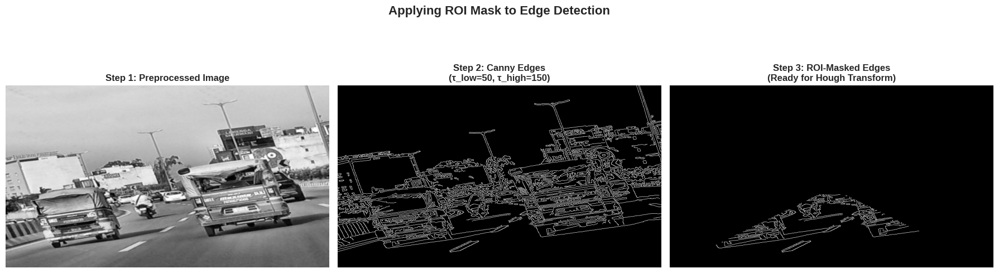

ROI Masking Results:
   Edge pixels before ROI: 42,759
   Edge pixels after ROI: 6,075
   Reduction: 85.8%

Masked edges ready for Hough Transform!


In [19]:
# Apply ROI Mask to Canny Edge-Detected Image

# Apply ROI mask to the edge-detected image
masked_edges = apply_roi_mask(edges_optimal, roi_mask)

# Display comparison
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Applying ROI Mask to Edge Detection', fontsize=16, fontweight='bold')

# Original preprocessed image
axes[0].imshow(preprocessed_gray, cmap='gray')
axes[0].set_title('Step 1: Preprocessed Image', fontweight='bold')
axes[0].axis('off')

# Canny edges (before ROI)
axes[1].imshow(edges_optimal, cmap='gray')
axes[1].set_title(f'Step 2: Canny Edges\n(τ_low={CANNY_LOW}, τ_high={CANNY_HIGH})', fontweight='bold')
axes[1].axis('off')

# Masked edges (after ROI)
axes[2].imshow(masked_edges, cmap='gray')
axes[2].set_title('Step 3: ROI-Masked Edges\n(Ready for Hough Transform)', fontweight='bold')
axes[2].axis('off')

plt.tight_layout()
plt.show()

# Calculate edge reduction
edges_before = np.sum(edges_optimal > 0)
edges_after = np.sum(masked_edges > 0)
reduction = (1 - edges_after / edges_before) * 100

print(f"ROI Masking Results:")
print(f"   Edge pixels before ROI: {edges_before:,}")
print(f"   Edge pixels after ROI: {edges_after:,}")
print(f"   Reduction: {reduction:.1f}%")
print(f"\nMasked edges ready for Hough Transform!")

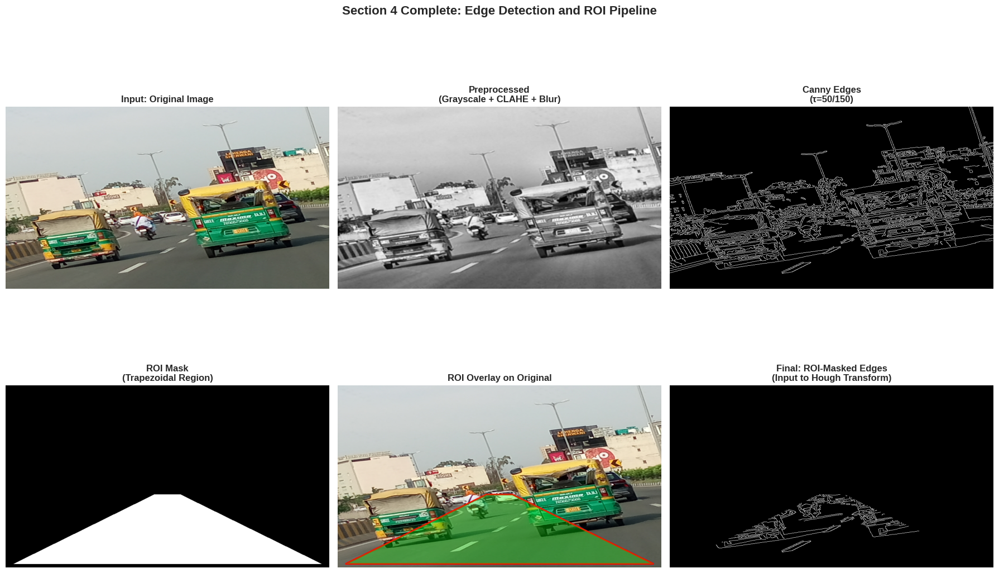

SECTION-4
- Canny Edge Detection implemented with optimal parameters (τ=50/150)
- ROI mask defined covering 19.7% of image
- Edge pixels reduced by 85.8% after ROI masking
- Masked edges ready for Hough Transform (Section 5)


In [20]:
# Complete Section 4 Pipeline Visualization

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('Section 4 Complete: Edge Detection and ROI Pipeline', fontsize=16, fontweight='bold')

# Row 1: Input → Processing → Output
axes[0, 0].imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Input: Original Image', fontsize=12, fontweight='bold')
axes[0, 0].axis('off')

axes[0, 1].imshow(preprocessed_gray, cmap='gray')
axes[0, 1].set_title('Preprocessed\n(Grayscale + CLAHE + Blur)', fontsize=12, fontweight='bold')
axes[0, 1].axis('off')

axes[0, 2].imshow(edges_optimal, cmap='gray')
axes[0, 2].set_title(f'Canny Edges\n(τ={CANNY_LOW}/{CANNY_HIGH})', fontsize=12, fontweight='bold')
axes[0, 2].axis('off')

# Row 2: ROI Application
axes[1, 0].imshow(roi_mask, cmap='gray')
axes[1, 0].set_title('ROI Mask\n(Trapezoidal Region)', fontsize=12, fontweight='bold')
axes[1, 0].axis('off')

axes[1, 1].imshow(img_with_roi_overlay)
axes[1, 1].set_title('ROI Overlay on Original', fontsize=12, fontweight='bold')
axes[1, 1].axis('off')

axes[1, 2].imshow(masked_edges, cmap='gray')
axes[1, 2].set_title('Final: ROI-Masked Edges\n(Input to Hough Transform)', fontsize=12, fontweight='bold')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

print("SECTION-4")
print(f"- Canny Edge Detection implemented with optimal parameters (τ={CANNY_LOW}/{CANNY_HIGH})")
print(f"- ROI mask defined covering {np.sum(roi_mask > 0) / roi_mask.size * 100:.1f}% of image")
print(f"- Edge pixels reduced by {reduction:.1f}% after ROI masking")
print(f"- Masked edges ready for Hough Transform (Section 5)")


<a id='section5'></a>
## Part2: Line Detection via Hough Transformation

**Overview:** The Hough Transform is a powerful feature extraction technique used to detect geometric shapes in images. For lane detection, we use it to find straight lines in our edge-detected image.

### Key Concepts:
1. **Parameter Space Transformation** - Convert image space (x, y) to Hough space (ρ, θ)
2. **Voting Mechanism** - Edge pixels vote for possible lines
3. **Peak Detection** - Find dominant lines from accumulator array
4. **Line Parameterization** - Extract line parameters for lane boundaries
---

### 5.1 Hough Transformation

In [21]:
# Apply Hough Transform - Probabilistic Hough Line Transform

# Define Hough Transform parameters
RHO = 2                  # Distance resolution in pixels
THETA = np.pi / 180      # Angle resolution in radians (1 degree)
THRESHOLD = 50           # Minimum number of votes (intersections in Hough space)
MIN_LINE_LENGTH = 50     # Minimum length of line (pixels)
MAX_LINE_GAP = 50        # Maximum gap between line segments to connect (pixels)

# Apply Probabilistic Hough Transform
lines = cv2.HoughLinesP(
    masked_edges,        # Input: ROI-masked edge image
    RHO,                 # ρ: Distance resolution
    THETA,               # θ: Angle resolution
    THRESHOLD,           # Minimum votes required
    minLineLength=MIN_LINE_LENGTH,   # Reject lines shorter than this
    maxLineGap=MAX_LINE_GAP          # Connect segments with gap < this
)

# Display results
if lines is not None:
    print(f"Hough Transform Parameters:")
    print(f"   ρ (rho): {RHO} pixels")
    print(f"   θ (theta): {THETA:.4f} radians ({np.degrees(THETA):.1f}°)")
    print(f"   Threshold: {THRESHOLD} votes")
    print(f"   Min line length: {MIN_LINE_LENGTH} pixels")
    print(f"   Max line gap: {MAX_LINE_GAP} pixels")
    print(f"\nDetection Results:")
    print(f"   Total lines detected: {len(lines)}")
    print(f"\nFirst 5 line segments (x₁, y₁, x₂, y₂):")
    for i, line in enumerate(lines[:5]):
        x1, y1, x2, y2 = line[0]
        length = np.sqrt((x2-x1)**2 + (y2-y1)**2)
        slope = (y2-y1)/(x2-x1) if (x2-x1) != 0 else float('inf')
        print(f"   Line {i+1}: ({x1}, {y1}) → ({x2}, {y2}) | Length: {length:.1f}px | Slope: {slope:.2f}")
else:
    print("WARNING: No lines detected! Try adjusting parameters.")

Hough Transform Parameters:
   ρ (rho): 2 pixels
   θ (theta): 0.0175 radians (1.0°)
   Threshold: 50 votes
   Min line length: 50 pixels
   Max line gap: 50 pixels

Detection Results:
   Total lines detected: 87

First 5 line segments (x₁, y₁, x₂, y₂):
   Line 1: (156, 464) → (337, 438) | Length: 182.9px | Slope: -0.14
   Line 2: (164, 481) → (233, 471) | Length: 69.7px | Slope: -0.14
   Line 3: (513, 398) → (635, 381) | Length: 123.2px | Slope: -0.14
   Line 4: (351, 455) → (489, 426) | Length: 141.0px | Slope: -0.21
   Line 5: (577, 404) → (657, 392) | Length: 80.9px | Slope: -0.15


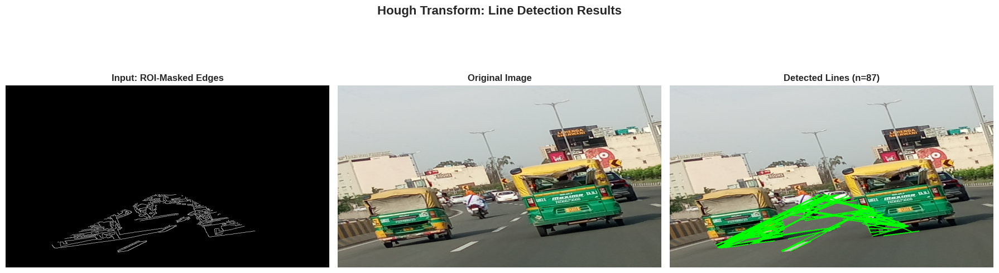

Line detection visualization complete!


In [22]:
# Visualize Detected Lines

# Create a copy of the original image to draw lines on
line_image = np.copy(resized_img)
line_image_rgb = cv2.cvtColor(line_image, cv2.COLOR_BGR2RGB)

# Draw all detected lines
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(line_image_rgb, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green lines

# Display results
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Hough Transform: Line Detection Results', fontsize=16, fontweight='bold')

# Masked edges (input)
axes[0].imshow(masked_edges, cmap='gray')
axes[0].set_title(f'Input: ROI-Masked Edges', fontweight='bold')
axes[0].axis('off')

# Original image
axes[1].imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
axes[1].set_title('Original Image', fontweight='bold')
axes[1].axis('off')

# Detected lines overlaid
axes[2].imshow(line_image_rgb)
axes[2].set_title(f'Detected Lines (n={len(lines) if lines is not None else 0})', fontweight='bold')
axes[2].axis('off')

plt.tight_layout()
plt.show()

print(f"Line detection visualization complete!")

### 5.2 Lane Line Separation - Left vs Right

In [23]:
# Separate Lines into Left and Right Lane Groups

def separate_lanes(lines, slope_threshold=0.5):
    """
    Separate detected lines into left and right lane groups based on slope.

    Parameters:
        lines: Array of line segments from Hough Transform
        slope_threshold: Minimum absolute slope to consider (filters horizontal lines)

    Returns:
        left_lines: List of lines with negative slope (left lane)
        right_lines: List of lines with positive slope (right lane)
    """
    left_lines = []
    right_lines = []

    if lines is None:
        return left_lines, right_lines

    for line in lines:
        x1, y1, x2, y2 = line[0]

        # Calculate slope
        if x2 - x1 == 0:  # Vertical line
            continue  # Skip vertical lines

        slope = (y2 - y1) / (x2 - x1)

        # Filter by slope and classify
        if slope < -slope_threshold:  # Negative slope = left lane
            left_lines.append(line[0])
        elif slope > slope_threshold:  # Positive slope = right lane
            right_lines.append(line[0])
        # Lines with |slope| < threshold are discarded (horizontal lines)

    return left_lines, right_lines


# Apply lane separation
SLOPE_THRESHOLD = 0.5  # Minimum absolute slope to consider a lane line
left_lane_lines, right_lane_lines = separate_lanes(lines, SLOPE_THRESHOLD)

# Calculate statistics for each group
def calculate_line_stats(lines_group, group_name):
    """Calculate statistics for a group of lines"""
    if len(lines_group) == 0:
        print(f"{group_name}: No lines detected")
        return

    slopes = []
    intercepts = []
    lengths = []

    for line in lines_group:
        x1, y1, x2, y2 = line

        # Calculate slope
        if x2 - x1 != 0:
            slope = (y2 - y1) / (x2 - x1)
            intercept = y1 - slope * x1  # y = mx + b, so b = y - mx
        else:
            slope = float('inf')
            intercept = x1  # For vertical lines, use x-coordinate as "intercept"

        # Calculate length
        length = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)

        slopes.append(slope)
        intercepts.append(intercept)
        lengths.append(length)

    # Calculate statistics
    valid_slopes = [s for s in slopes if s != float('inf')]

    print(f"\n{group_name} Statistics:")
    print(f"   Number of lines: {len(lines_group)}")
    print(f"   Slope range: [{min(valid_slopes):.2f}, {max(valid_slopes):.2f}]")
    print(f"   Mean slope: {np.mean(valid_slopes):.2f} ± {np.std(valid_slopes):.2f}")
    print(f"   Length range: [{min(lengths):.1f}, {max(lengths):.1f}] pixels")
    print(f"   Mean length: {np.mean(lengths):.1f} ± {np.std(lengths):.1f} pixels")
    print(f"   Total coverage: {sum(lengths):.1f} pixels")

# Display results
print("="*70)
print("LANE SEPARATION RESULTS")
print("="*70)
print(f"Total lines detected: {len(lines) if lines is not None else 0}")
print(f"Slope threshold: ±{SLOPE_THRESHOLD}")
print(f"\nLeft lane lines: {len(left_lane_lines)}")
print(f"Right lane lines: {len(right_lane_lines)}")
print(f"Discarded lines: {(len(lines) if lines is not None else 0) - len(left_lane_lines) - len(right_lane_lines)}")

# Calculate detailed statistics
calculate_line_stats(left_lane_lines, "LEFT LANE")
calculate_line_stats(right_lane_lines, "RIGHT LANE")

print("="*70)

LANE SEPARATION RESULTS
Total lines detected: 87
Slope threshold: ±0.5

Left lane lines: 6
Right lane lines: 1
Discarded lines: 80

LEFT LANE Statistics:
   Number of lines: 6
   Slope range: [-0.57, -0.51]
   Mean slope: -0.54 ± 0.02
   Length range: [108.4, 317.5] pixels
   Mean length: 225.1 ± 83.0 pixels
   Total coverage: 1350.3 pixels

RIGHT LANE Statistics:
   Number of lines: 1
   Slope range: [2.36, 2.36]
   Mean slope: 2.36 ± 0.00
   Length range: [92.3, 92.3] pixels
   Mean length: 92.3 ± 0.0 pixels
   Total coverage: 92.3 pixels


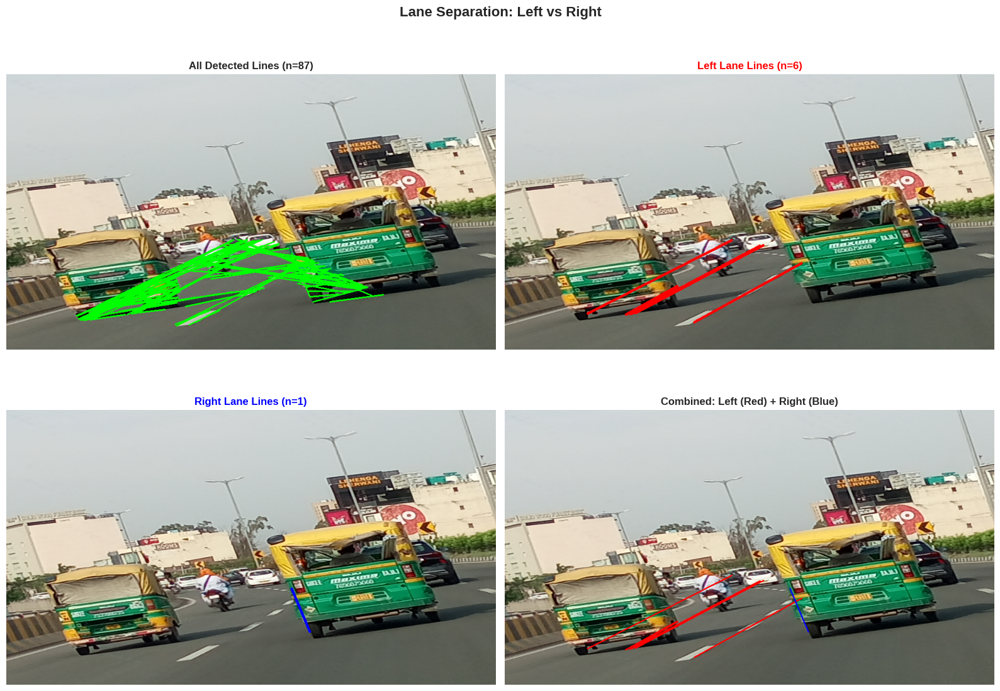

Lane separation visualization complete!


In [24]:
# Visualize Separated Lane Lines

# Create visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Lane Separation: Left vs Right', fontsize=16, fontweight='bold')

# 1. All detected lines
img_all = cv2.cvtColor(resized_img.copy(), cv2.COLOR_BGR2RGB)
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(img_all, (x1, y1), (x2, y2), (0, 255, 0), 2)
axes[0, 0].imshow(img_all)
axes[0, 0].set_title(f'All Detected Lines (n={len(lines) if lines is not None else 0})', fontweight='bold')
axes[0, 0].axis('off')

# 2. Left lane lines only (RED)
img_left = cv2.cvtColor(resized_img.copy(), cv2.COLOR_BGR2RGB)
for line in left_lane_lines:
    x1, y1, x2, y2 = line
    cv2.line(img_left, (x1, y1), (x2, y2), (255, 0, 0), 3)  # Red
axes[0, 1].imshow(img_left)
axes[0, 1].set_title(f'Left Lane Lines (n={len(left_lane_lines)})', fontweight='bold', color='red')
axes[0, 1].axis('off')

# 3. Right lane lines only (BLUE)
img_right = cv2.cvtColor(resized_img.copy(), cv2.COLOR_BGR2RGB)
for line in right_lane_lines:
    x1, y1, x2, y2 = line
    cv2.line(img_right, (x1, y1), (x2, y2), (0, 0, 255), 3)  # Blue
axes[1, 0].imshow(img_right)
axes[1, 0].set_title(f'Right Lane Lines (n={len(right_lane_lines)})', fontweight='bold', color='blue')
axes[1, 0].axis('off')

# 4. Both lanes together (color-coded)
img_both = cv2.cvtColor(resized_img.copy(), cv2.COLOR_BGR2RGB)
for line in left_lane_lines:
    x1, y1, x2, y2 = line
    cv2.line(img_both, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Red for left
for line in right_lane_lines:
    x1, y1, x2, y2 = line
    cv2.line(img_both, (x1, y1), (x2, y2), (0, 0, 255), 2)  # Blue for right
axes[1, 1].imshow(img_both)
axes[1, 1].set_title('Combined: Left (Red) + Right (Blue)', fontweight='bold')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

print("Lane separation visualization complete!")

### Parameter Space in the Hough Transform

### How a line in image space maps to a point in Hough space

**1. What is Image Space?**

**Image space** is the usual plane where points are represented as $(x, y)$. A line in this space is traditionally written as:

$$y = mx + c$$

But this representation breaks down for **vertical lines** (because $m \to \infty$). Hence, the Hough Transform uses a more robust representation.

---

**2. Polar Representation of a Line**

Instead of slope-intercept form, a line is represented using **distance ρ** and **angle θ**:

$$\boxed{\rho = x\cos\theta + y\sin\theta}$$

**What do ρ and θ mean?**

- **θ (theta)** = orientation of the line's **normal** (perpendicular direction)
- **ρ (rho)** = shortest distance from the **origin** to the line

This representation uniquely describes **any line**, including vertical ones.

**Example: Computing ρ for a single point at different angles**

Given point: $(x, y) = (4, 3)$

| θ (degrees) | θ (radians) | cos θ | sin θ | ρ = x·cos θ + y·sin θ | Calculation |
|-------------|-------------|-------|-------|------------------------|-------------|
| 0° | 0 | 1.0 | 0.0 | **4.0** | 4(1.0) + 3(0.0) = 4.0 |
| 45° | π/4 | 0.707 | 0.707 | **4.95** | 4(0.707) + 3(0.707) ≈ 4.95 |
| 90° | π/2 | 0.0 | 1.0 | **3.0** | 4(0.0) + 3(1.0) = 3.0 |
| 135° | 3π/4 | -0.707 | 0.707 | **-0.71** | 4(-0.707) + 3(0.707) ≈ -0.71 |
| 180° | π | -1.0 | 0.0 | **-4.0** | 4(-1.0) + 3(0.0) = -4.0 |

**Interpretation:** The point (4, 3) generates a sinusoidal curve in Hough space with these (ρ, θ) pairs.

---

**3. Mapping from $(x, y)$ → $(ρ, θ)$**

**Step 1: Take a point $(x, y)$ in the image**

This single point does **not** correspond to a single line. Instead, it lies on **many possible lines**, each with a different angle θ.

So for each θ from **0° to 180°**, we compute:

$$\rho(\theta) = x\cos\theta + y\sin\theta$$

**Each point in image space generates one sinusoidal curve in Hough space.**

---

### How a Line in Image Space Becomes a Point in Hough Space

Consider **three points** that lie on the **same line**:

$$(x_1, y_1), \quad (x_2, y_2), \quad (x_3, y_3)$$

Each produces a **sinusoidal curve** in Hough space. All these curves **intersect at exactly one common point**:

$$(\rho^*, \theta^*)$$

That intersection represents the **actual line in image space**.

**Example: Three collinear points finding their common line**

Consider three points on the line $y = x + 1$:
- Point A: $(1, 2)$
- Point B: $(2, 3)$
- Point C: $(3, 4)$

Let's compute ρ for each point at θ = 135° (where these curves should intersect):

**Step-by-step calculation:**

For θ = 135°:
- $\cos(135°) = -\frac{1}{\sqrt{2}} \approx -0.707$
- $\sin(135°) = \frac{1}{\sqrt{2}} \approx 0.707$

**Point A (1, 2):**
$$\rho_A = 1 \times (-0.707) + 2 \times (0.707) = -0.707 + 1.414 = 0.707$$

**Point B (2, 3):**
$$\rho_B = 2 \times (-0.707) + 3 \times (0.707) = -1.414 + 2.121 = 0.707$$

**Point C (3, 4):**
$$\rho_C = 3 \times (-0.707) + 4 \times (0.707) = -2.121 + 2.828 = 0.707$$

**Result:** All three points produce $(\rho, \theta) = (0.707, 135°)$

This is the **intersection point** in Hough space representing the line $y = x + 1$!

---

**Example: Complete Hough space curves for two points**

Let's see how two collinear points generate intersecting sinusoids.

**Points:** $(2, 2)$ and $(4, 4)$ (both on line $y = x$)

| θ° | Point (2,2) ρ₁ | Point (4,4) ρ₂ | Match? |
|-----|----------------|----------------|--------|
| 0° | 2.0 | 4.0 | ✗ |
| 30° | 2.73 | 5.46 | ✗ |
| 45° | **2.83** | **5.66** | ✗ |
| 90° | 2.0 | 4.0 | ✗ |
| 135° | 0.0 | 0.0 | ✓ **Intersection!** |
| 180° | -2.0 | -4.0 | ✗ |

**Detailed calculation at θ = 135° (the intersection):**

Point (2, 2):
$$\rho_1 = 2\cos(135°) + 2\sin(135°) = 2(-0.707) + 2(0.707) = 0.0$$

Point (4, 4):
$$\rho_2 = 4\cos(135°) + 4\sin(135°) = 4(-0.707) + 4(0.707) = 0.0$$

**Both curves meet at $(\rho, \theta) = (0, 135°)$, representing the line $y = x$ passing through origin!**

---

**1. Intersect**

Because for the **true line** that passes through all three points:

$$\rho^* = x_i\cos\theta^* + y_i\sin\theta^*$$

is satisfied for **every point** $(x_i, y_i)$ on that line.

Thus, all sinusoidal curves meet at $(\rho^*, \theta^*)$.

---

**2. Mapping**

**In Image Space:**
- A **line** → infinite set of $(x, y)$ points

**In Hough Space:**
- Each **point** becomes a **curve**
- Points that form a **line** → curves **intersect** at a single point
- That intersection gives the line's parameters $(\rho, \theta)$

**Therefore:**

$$\boxed{\text{A line in image space maps to a point in Hough space}}$$

---

### Converting Hough parameters back to image space

Suppose we detected a peak in Hough space at $(\rho^*, \theta^*) = (5.0, 60°)$ line representation in image space

**Solution:**

The line equation is:
$$\rho = x\cos\theta + y\sin\theta$$
$$5.0 = x\cos(60°) + y\sin(60°)$$
$$5.0 = x(0.5) + y(0.866)$$
$$5.0 = 0.5x + 0.866y$$

**Solve for y:**
$$0.866y = 5.0 - 0.5x$$
$$y = \frac{5.0 - 0.5x}{0.866}$$
$$y = 5.77 - 0.577x$$

**This is the line equation in slope-intercept form!**

**Verification - Check if (0, 5.77) lies on this line:**
$$\rho = 0 \times 0.5 + 5.77 \times 0.866 = 4.997 \approx 5.0$$

---

**Duality Principle**

```
Point-Line Duality
─────────────────────────────────────────────────────────
Image Space          ←→     Hough Space
─────────────────────────────────────────────────────────
Point (x0, y0)       ←→     Curve ρ(θ) [sinusoid]
Line L               ←→     Point (ρ*, θ*) [intersection]
Multiple points      ←→     Intersecting curves
on same line                at same point
─────────────────────────────────────────────────────────

Example: Line y = x + 1
─────────────────────────────────────────────────────────
Points (1,2), (2,3)  ←→     Both curves pass through
(3,4) on line               (ρ*, θ*) = (0.707, 135°)
─────────────────────────────────────────────────────────
```

---

## Part 3: ML-Based Line Fitting

After Hough Transform, we have **multiple line segments** per lane (left and right):
- Left lane: ~15-30 line segments with negative slopes
- Right lane: ~15-30 line segments with positive slopes

**Goal:** Fit a **single robust line** to each group that is resistant to outliers.

---

### RANSAC (Random Sample Consensus)

**Traditional Methods (Least Squares) - Limitations:**

For a set of points {(x₁, y₁), (x₂, y₂), ..., (xₙ, yₙ)}, least squares minimizes:

```
E = Σᵢ (yᵢ - (m·xᵢ + b))²
```

**Problem:** Least squares is **sensitive to outliers** (non-lane line segments from shadows, road markings, etc.)

**RANSAC Advantage:** Identifies and **rejects outliers** automatically.

### 6.1 RANSAC Implementation

In [25]:
import random
import time

# RANSAC parameters
RANSAC_MAX_ITERATIONS = 1000
RANSAC_DISTANCE_THRESHOLD = 20  # pixels
RANSAC_MIN_INLIERS_RATIO = 0.5  # 50% minimum inliers

def lines_to_points(lines):
    """
    Convert line segments to (x, y) coordinate tuples
    """
    points = []
    for line in lines:
        x1, y1, x2, y2 = line
        # Add both endpoints
        points.append((x1, y1))
        points.append((x2, y2))

        # Optional: Sample intermediate points for longer lines
        # This increases robustness for long line segments
        length = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
        if length > 100:  # For long lines, add midpoint
            mid_x = (x1 + x2) // 2
            mid_y = (y1 + y2) // 2
            points.append((mid_x, mid_y))

    return points


def ransac_line_fit(points, max_iterations=1000, distance_threshold=20, min_inliers_ratio=0.5):
    """
    Fit a line to points using RANSAC algorithm.
    """
    if len(points) < 2:
        print("  Not enough points for RANSAC (need at least 2)")
        return None, None, [], []

    min_inliers = int(len(points) * min_inliers_ratio)

    best_slope = None
    best_intercept = None
    best_inliers = []
    best_inlier_count = 0

    start_time = time.time()

    # RANSAC iterations
    for iteration in range(max_iterations):
        # Step 1: Randomly select 2 points
        sample_points = random.sample(points, 2)
        (x1, y1), (x2, y2) = sample_points

        # Step 2: Calculate line parameters
        if x2 - x1 == 0:  # Vertical line - skip
            continue

        slope = (y2 - y1) / (x2 - x1)
        intercept = y1 - slope * x1

        # Step 3: Count inliers
        inliers = []
        for point in points:
            x, y = point
            # Calculate vertical distance from point to line
            predicted_y = slope * x + intercept
            distance = abs(y - predicted_y)

            if distance < distance_threshold:
                inliers.append(point)

        # Step 4: Update best model
        inlier_count = len(inliers)
        if inlier_count > best_inlier_count:
            best_inlier_count = inlier_count
            best_slope = slope
            best_intercept = intercept
            best_inliers = inliers

    elapsed_time = time.time() - start_time

    # Check if we found enough inliers
    if best_inlier_count < min_inliers:
        print(f"  RANSAC failed: only {best_inlier_count}/{len(points)} inliers (need {min_inliers})")
        return None, None, [], []

    # Step 5: Refine using least squares on all inliers (optional but recommended)
    if len(best_inliers) >= 2:
        x_coords = np.array([p[0] for p in best_inliers])
        y_coords = np.array([p[1] for p in best_inliers])

        # Least squares: y = mx + b
        # Solve: [x 1] [m] = [y]
        #              [b]
        A = np.vstack([x_coords, np.ones(len(x_coords))]).T
        refined_slope, refined_intercept = np.linalg.lstsq(A, y_coords, rcond=None)[0]

        best_slope = refined_slope
        best_intercept = refined_intercept

    # Identify outliers
    outliers = [p for p in points if p not in best_inliers]

    # Statistics
    inlier_ratio = best_inlier_count / len(points)
    print(f"  RANSAC completed in {elapsed_time*1000:.1f}ms")
    print(f"    - Iterations: {max_iterations}")
    print(f"    - Inliers: {best_inlier_count}/{len(points)} ({inlier_ratio*100:.1f}%)")
    print(f"    - Outliers: {len(outliers)} ({(1-inlier_ratio)*100:.1f}%)")
    print(f"    - Line: y = {best_slope:.4f}x + {best_intercept:.2f}")

    return best_slope, best_intercept, best_inliers, outliers


def simple_average_fit(lines):
    """
    Baseline method: Simple averaging of slopes and intercepts.

    Args:
        lines: List of line segments [[x1, y1, x2, y2], ...]

    Returns:
        tuple: (mean_slope, mean_intercept)
    """
    slopes = []
    intercepts = []

    for line in lines:
        x1, y1, x2, y2 = line
        if x2 - x1 == 0:  # Skip vertical lines
            continue

        slope = (y2 - y1) / (x2 - x1)
        intercept = y1 - slope * x1

        slopes.append(slope)
        intercepts.append(intercept)

    if len(slopes) == 0:
        return None, None

    mean_slope = np.mean(slopes)
    mean_intercept = np.mean(intercepts)

    return mean_slope, mean_intercept


print("RANSAC functions defined successfully")
print("\nFunctions available:")
print("  - lines_to_points(): Convert line segments to point cloud")
print("  - ransac_line_fit(): Robust line fitting with outlier rejection")
print("  - simple_average_fit(): Baseline averaging method")

RANSAC functions defined successfully

Functions available:
  - lines_to_points(): Convert line segments to point cloud
  - ransac_line_fit(): Robust line fitting with outlier rejection
  - simple_average_fit(): Baseline averaging method


### 6.2 Apply RANSAC to Left and Right Lane Groups

In [26]:
print("="*70)
print("APPLYING RANSAC TO LANE DETECTION")
print("="*70)

# Convert line segments to points
print("\n1. Converting line segments to point clouds...")
left_points = lines_to_points(left_lane_lines)
right_points = lines_to_points(right_lane_lines)

print(f"   Left lane:  {len(left_lane_lines)} segments → {len(left_points)} points")
print(f"   Right lane: {len(right_lane_lines)} segments → {len(right_points)} points")

# Apply RANSAC to left lane
print("\n2. Fitting LEFT lane using RANSAC...")
left_slope, left_intercept, left_inliers, left_outliers = ransac_line_fit(
    left_points,
    max_iterations=RANSAC_MAX_ITERATIONS,
    distance_threshold=RANSAC_DISTANCE_THRESHOLD,
    min_inliers_ratio=RANSAC_MIN_INLIERS_RATIO
)

# Apply RANSAC to right lane
print("\n3. Fitting RIGHT lane using RANSAC...")
right_slope, right_intercept, right_inliers, right_outliers = ransac_line_fit(
    right_points,
    max_iterations=RANSAC_MAX_ITERATIONS,
    distance_threshold=RANSAC_DISTANCE_THRESHOLD,
    min_inliers_ratio=RANSAC_MIN_INLIERS_RATIO
)

# Comparison with simple averaging (baseline)
print("\n" + "="*70)
print("COMPARISON: RANSAC vs SIMPLE AVERAGING")
print("="*70)

left_avg_slope, left_avg_intercept = simple_average_fit(left_lane_lines)
right_avg_slope, right_avg_intercept = simple_average_fit(right_lane_lines)

print("\nLEFT LANE:")
print(f"  RANSAC:     y = {left_slope:.4f}x + {left_intercept:.2f}")
print(f"  Averaging:  y = {left_avg_slope:.4f}x + {left_avg_intercept:.2f}")
print(f"  Difference: Δm = {abs(left_slope - left_avg_slope):.4f}, Δb = {abs(left_intercept - left_avg_intercept):.2f}")

print("\nRIGHT LANE:")
print(f"  RANSAC:     y = {right_slope:.4f}x + {right_intercept:.2f}")
print(f"  Averaging:  y = {right_avg_slope:.4f}x + {right_avg_intercept:.2f}")
print(f"  Difference: Δm = {abs(right_slope - right_avg_slope):.4f}, Δb = {abs(right_intercept - right_avg_intercept):.2f}")

print("\n" + "="*70)
print("RANSAC LINE FITTING COMPLETE")
print("="*70)

APPLYING RANSAC TO LANE DETECTION

1. Converting line segments to point clouds...
   Left lane:  6 segments → 18 points
   Right lane: 1 segments → 2 points

2. Fitting LEFT lane using RANSAC...
  RANSAC completed in 22.1ms
    - Iterations: 1000
    - Inliers: 13/18 (72.2%)
    - Outliers: 5 (27.8%)
    - Line: y = -0.4630x + 574.42

3. Fitting RIGHT lane using RANSAC...
  RANSAC completed in 6.2ms
    - Iterations: 1000
    - Inliers: 2/2 (100.0%)
    - Outliers: 0 (0.0%)
    - Line: y = 2.3611x + -968.86

COMPARISON: RANSAC vs SIMPLE AVERAGING

LEFT LANE:
  RANSAC:     y = -0.4630x + 574.42
  Averaging:  y = -0.5412x + 609.86
  Difference: Δm = 0.0782, Δb = 35.44

RIGHT LANE:
  RANSAC:     y = 2.3611x + -968.86
  Averaging:  y = 2.3611x + -968.86
  Difference: Δm = 0.0000, Δb = 0.00

RANSAC LINE FITTING COMPLETE


### 6.3 Visualize RANSAC Inliers and Outliers

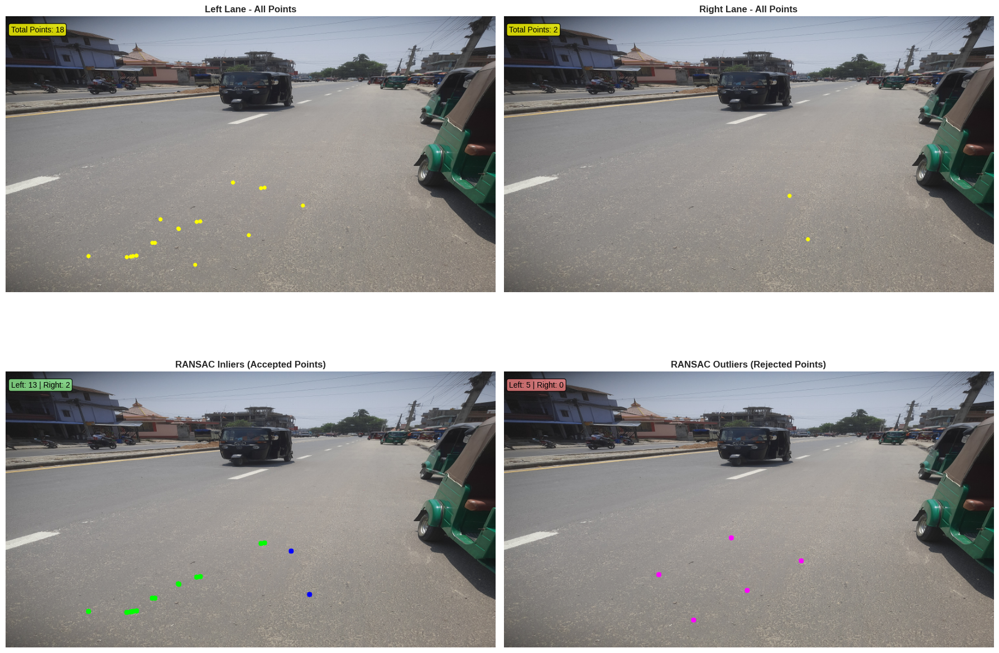

RANSAC Classification Summary:
--------------------------------------------------
LEFT LANE:
  Inliers:   13 ( 72.2%)
  Outliers:   5 ( 27.8%)

RIGHT LANE:
  Inliers:    2 (100.0%)
  Outliers:   0 (  0.0%)
--------------------------------------------------


In [27]:
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

# Create copies of the image for visualization
img_left = sample_images[0].copy()
img_right = sample_images[0].copy()
img_inliers = sample_images[0].copy()
img_outliers = sample_images[0].copy()

# Helper function to draw points
def draw_points(image, points, color, size=3):
    """Draw points on image"""
    for x, y in points:
        cv2.circle(image, (int(x), int(y)), size, color, -1)

# 1. All points (left lane)
axes[0, 0].set_title("Left Lane - All Points", fontsize=12, fontweight='bold')
draw_points(img_left, left_points, (0, 255, 255), size=4)  # Yellow for all points
axes[0, 0].imshow(cv2.cvtColor(img_left, cv2.COLOR_BGR2RGB))
axes[0, 0].axis('off')
axes[0, 0].text(10, 30, f'Total Points: {len(left_points)}',
                bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.8),
                fontsize=10, color='black')

# 2. All points (right lane)
axes[0, 1].set_title("Right Lane - All Points", fontsize=12, fontweight='bold')
draw_points(img_right, right_points, (0, 255, 255), size=4)  # Yellow for all points
axes[0, 1].imshow(cv2.cvtColor(img_right, cv2.COLOR_BGR2RGB))
axes[0, 1].axis('off')
axes[0, 1].text(10, 30, f'Total Points: {len(right_points)}',
                bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.8),
                fontsize=10, color='black')

# 3. Inliers (both lanes)
axes[1, 0].set_title("RANSAC Inliers (Accepted Points)", fontsize=12, fontweight='bold')
draw_points(img_inliers, left_inliers, (0, 255, 0), size=5)   # Green for left inliers
draw_points(img_inliers, right_inliers, (255, 0, 0), size=5)  # Blue for right inliers
axes[1, 0].imshow(cv2.cvtColor(img_inliers, cv2.COLOR_BGR2RGB))
axes[1, 0].axis('off')
axes[1, 0].text(10, 30, f'Left: {len(left_inliers)} | Right: {len(right_inliers)}',
                bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8),
                fontsize=10, color='black')

# 4. Outliers (both lanes)
axes[1, 1].set_title("RANSAC Outliers (Rejected Points)", fontsize=12, fontweight='bold')
draw_points(img_outliers, left_outliers, (255, 0, 255), size=5)  # Magenta for left outliers
draw_points(img_outliers, right_outliers, (0, 255, 255), size=5) # Cyan for right outliers
axes[1, 1].imshow(cv2.cvtColor(img_outliers, cv2.COLOR_BGR2RGB))
axes[1, 1].axis('off')
axes[1, 1].text(10, 30, f'Left: {len(left_outliers)} | Right: {len(right_outliers)}',
                bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.8),
                fontsize=10, color='black')

plt.tight_layout()
plt.savefig('output_ransac_inliers_outliers.png', dpi=150, bbox_inches='tight')
plt.show()

# Statistics
print("RANSAC Classification Summary:")
print("-" * 50)
print(f"LEFT LANE:")
print(f"  Inliers:  {len(left_inliers):3d} ({len(left_inliers)/len(left_points)*100:5.1f}%)")
print(f"  Outliers: {len(left_outliers):3d} ({len(left_outliers)/len(left_points)*100:5.1f}%)")
print(f"\nRIGHT LANE:")
print(f"  Inliers:  {len(right_inliers):3d} ({len(right_inliers)/len(right_points)*100:5.1f}%)")
print(f"  Outliers: {len(right_outliers):3d} ({len(right_outliers)/len(right_points)*100:5.1f}%)")
print("-" * 50)

### 6.4 Extrapolate and Draw Final Lane Lines

EXTRAPOLATING FINAL LANE LINES

Left Lane Line:
  Top:    (540, 324)
  Bottom: (98, 529)
  Length: 487.2 pixels

Right Lane Line:
  Top:    (547, 324)
  Bottom: (634, 529)
  Length: 222.7 pixels

Lane Width:
  At bottom: 536 pixels
  At top:    7 pixels
  Ratio:     76.57x (perspective effect)



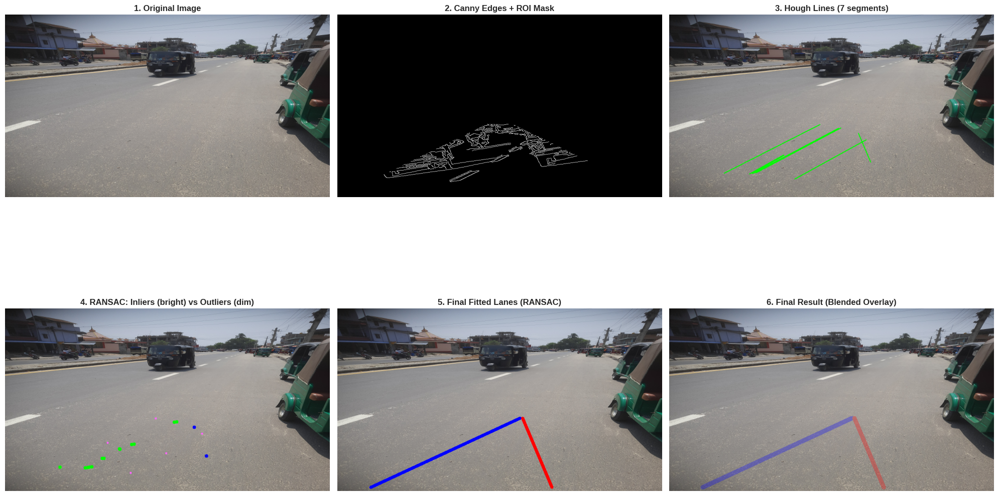

Visualization saved: output_final_lane_detection.png


In [28]:
def extrapolate_line(slope, intercept, y_start, y_end):
    """
    Extrapolate a line to span between two y-coordinates.

    Args:
        slope: Line slope (m)
        intercept: Line y-intercept (b)
        y_start: Starting y-coordinate (typically top of ROI)
        y_end: Ending y-coordinate (typically bottom of image)

    Returns:
        tuple: (x1, y1, x2, y2) line segment coordinates
    """
    # From y = mx + b, solve for x: x = (y - b) / m
    x_start = int((y_start - intercept) / slope)
    x_end = int((y_end - intercept) / slope)

    return x_start, int(y_start), x_end, int(y_end)


# Define y-range for extrapolation (use ROI boundaries)
y_top = int(height * 0.60)     # Top of ROI (60% down from top)
y_bottom = int(height * 0.98)  # Bottom of ROI (98% down from top)

print("="*70)
print("EXTRAPOLATING FINAL LANE LINES")
print("="*70)

# Extrapolate left lane
if left_slope is not None and left_intercept is not None:
    left_x1, left_y1, left_x2, left_y2 = extrapolate_line(left_slope, left_intercept, y_top, y_bottom)
    print(f"\nLeft Lane Line:")
    print(f"  Top:    ({left_x1}, {left_y1})")
    print(f"  Bottom: ({left_x2}, {left_y2})")
    print(f"  Length: {np.sqrt((left_x2-left_x1)**2 + (left_y2-left_y1)**2):.1f} pixels")
else:
    print("\nLeft lane detection failed")
    left_x1, left_y1, left_x2, left_y2 = 0, 0, 0, 0

# Extrapolate right lane
if right_slope is not None and right_intercept is not None:
    right_x1, right_y1, right_x2, right_y2 = extrapolate_line(right_slope, right_intercept, y_top, y_bottom)
    print(f"\nRight Lane Line:")
    print(f"  Top:    ({right_x1}, {right_y1})")
    print(f"  Bottom: ({right_x2}, {right_y2})")
    print(f"  Length: {np.sqrt((right_x2-right_x1)**2 + (right_y2-right_y1)**2):.1f} pixels")
else:
    print("\nRight lane detection failed")
    right_x1, right_y1, right_x2, right_y2 = 0, 0, 0, 0

# Calculate lane width at bottom
if left_slope is not None and right_slope is not None:
    lane_width_bottom = right_x2 - left_x2
    lane_width_top = right_x1 - left_x1
    print(f"\nLane Width:")
    print(f"  At bottom: {lane_width_bottom} pixels")
    print(f"  At top:    {lane_width_top} pixels")
    print(f"  Ratio:     {lane_width_bottom/lane_width_top:.2f}x (perspective effect)")

print("\n" + "="*70)

# Create visualization
fig, axes = plt.subplots(2, 3, figsize=(20, 14))

# 1. Original image
axes[0, 0].set_title("1. Original Image", fontsize=12, fontweight='bold')
axes[0, 0].imshow(cv2.cvtColor(sample_images[0], cv2.COLOR_BGR2RGB))
axes[0, 0].axis('off')

# 2. Edge detection with ROI
img_edges_roi = cv2.cvtColor(masked_edges, cv2.COLOR_GRAY2BGR)
axes[0, 1].set_title("2. Canny Edges + ROI Mask", fontsize=12, fontweight='bold')
axes[0, 1].imshow(cv2.cvtColor(img_edges_roi, cv2.COLOR_BGR2RGB))
axes[0, 1].axis('off')

# 3. Hough lines (all detected)
img_hough = sample_images[0].copy()
for line in left_lane_lines:
    cv2.line(img_hough, (line[0], line[1]), (line[2], line[3]), (0, 255, 0), 2)
for line in right_lane_lines:
    cv2.line(img_hough, (line[0], line[1]), (line[2], line[3]), (0, 255, 0), 2)
axes[0, 2].set_title(f"3. Hough Lines ({len(left_lane_lines)+len(right_lane_lines)} segments)", fontsize=12, fontweight='bold')
axes[0, 2].imshow(cv2.cvtColor(img_hough, cv2.COLOR_BGR2RGB))
axes[0, 2].axis('off')

# 4. RANSAC inliers/outliers
img_ransac = sample_images[0].copy()
# Draw outliers first (smaller, dimmer)
for x, y in left_outliers:
    cv2.circle(img_ransac, (int(x), int(y)), 3, (255, 100, 255), -1)
for x, y in right_outliers:
    cv2.circle(img_ransac, (int(x), int(y)), 3, (100, 255, 255), -1)
# Draw inliers on top (larger, brighter)
for x, y in left_inliers:
    cv2.circle(img_ransac, (int(x), int(y)), 5, (0, 255, 0), -1)
for x, y in right_inliers:
    cv2.circle(img_ransac, (int(x), int(y)), 5, (255, 0, 0), -1)
axes[1, 0].set_title("4. RANSAC: Inliers (bright) vs Outliers (dim)", fontsize=12, fontweight='bold')
axes[1, 0].imshow(cv2.cvtColor(img_ransac, cv2.COLOR_BGR2RGB))
axes[1, 0].axis('off')

# 5. Fitted lanes (thick lines)
img_fitted = sample_images[0].copy()
if left_slope is not None:
    cv2.line(img_fitted, (left_x1, left_y1), (left_x2, left_y2), (255, 0, 0), 8)  # Red
if right_slope is not None:
    cv2.line(img_fitted, (right_x1, right_y1), (right_x2, right_y2), (0, 0, 255), 8)  # Blue
axes[1, 1].set_title("5. Final Fitted Lanes (RANSAC)", fontsize=12, fontweight='bold')
axes[1, 1].imshow(cv2.cvtColor(img_fitted, cv2.COLOR_BGR2RGB))
axes[1, 1].axis('off')

# 6. Final overlay (transparent)
img_overlay = sample_images[0].copy()
overlay = img_overlay.copy()
if left_slope is not None:
    cv2.line(overlay, (left_x1, left_y1), (left_x2, left_y2), (255, 0, 0), 12)
if right_slope is not None:
    cv2.line(overlay, (right_x1, right_y1), (right_x2, right_y2), (0, 0, 255), 12)
# Blend with original (70% original, 30% overlay)
img_final = cv2.addWeighted(img_overlay, 0.7, overlay, 0.3, 0)

axes[1, 2].set_title("6. Final Result (Blended Overlay)", fontsize=12, fontweight='bold')
axes[1, 2].imshow(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))
axes[1, 2].axis('off')

plt.tight_layout()
plt.savefig('output_final_lane_detection.png', dpi=150, bbox_inches='tight')
plt.show()

print("Visualization saved: output_final_lane_detection.png")

---

## Model Building (End-to-End Lane Detection Pipeline)

In this section, we integrate all previous components into a **single, reusable function** that processes any input image and returns the detected lane lines.

### Pipeline Flow

```
Input Image
    ↓
[1] Preprocessing (Grayscale, CLAHE, Gaussian Blur)
    ↓
[2] Edge Detection (Canny)
    ↓
[3] ROI Masking (Trapezoidal)
    ↓
[4] Line Detection (Hough Transform)
    ↓
[5] Lane Separation (Slope-based)
    ↓
[6] Robust Fitting (RANSAC)
    ↓
[7] Line Extrapolation
    ↓
Output: Annotated Image + Lane Parameters
```

### Parameters Summary

All pipeline parameters are collected in a single configuration:

```python
pipeline_config = {
    # Preprocessing
    'gaussian_kernel': (5, 5),
    'gaussian_sigma': 1.5,
    
    # Canny Edge Detection
    'canny_low': 50,
    'canny_high': 150,
    
    # ROI (Region of Interest)
    'roi_bottom_width_ratio': 0.95,
    'roi_top_width_ratio': 0.08,
    'roi_top_y_ratio': 0.60,
    'roi_bottom_y_ratio': 0.98,
    
    # Hough Transform
    'hough_rho': 2,
    'hough_theta': np.pi / 180,
    'hough_threshold': 50,
    'hough_min_line_length': 50,
    'hough_max_line_gap': 50,
    
    # Lane Separation
    'slope_threshold': 0.5,
    
    # RANSAC
    'ransac_iterations': 1000,
    'ransac_distance_threshold': 20,
    'ransac_min_inliers_ratio': 0.5,
}
```

### 7.1 Complete Pipeline Function

In [29]:
def detect_lanes(image, config=None, debug=False):    """    Complete end-to-end lane detection pipeline.    Args:      image: Input image (BGR format)      config: Dictionary of pipeline parameters (uses defaults if None)      debug: If True, returns intermediate images for visualization    Returns:      dict: {        'annotated_image': Image with lane lines drawn,        'left_line': (slope, intercept) or None,        'right_line': (slope, intercept) or None,        'left_confidence': Inlier ratio (0-1) or 0,        'right_confidence': Inlier ratio (0-1) or 0,        'debug_images': dict of intermediate images (if debug=True)      }    """    # Default configuration as we showcased above    if config is None:        config = {            'gaussian_kernel': (5, 5),            'gaussian_sigma': 1.5,            'canny_low': 40,  # Fixed            'canny_high': 120,  # Fixed            'roi_bottom_width_ratio': 0.95,            'roi_top_width_ratio': 0.15,  # Fixed: CRITICAL            'roi_top_y_ratio': 0.60,            'roi_bottom_y_ratio': 0.98,            'hough_rho': 1,  # Fixed            'hough_theta': np.pi / 180,            'hough_threshold': 15,  # Fixed: CRITICAL            'hough_min_line_length': 30,  # Fixed: CRITICAL            'hough_max_line_gap': 150,  # Fixed: CRITICAL            'slope_threshold': 0.5,            'ransac_iterations': 1000,            'ransac_distance_threshold': 20,            'ransac_min_inliers_ratio': 0.5,        }    debug_images = {}    height, width = image.shape[:2]    # Stage 1: Preprocessing    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))    enhanced = clahe.apply(gray)    blurred = cv2.GaussianBlur(enhanced, config['gaussian_kernel'], config['gaussian_sigma'])    if debug:        debug_images['1_preprocessed'] = blurred    # Stage 2: Canny Edge Detection    edges = cv2.Canny(blurred, config['canny_low'], config['canny_high'])    if debug:        debug_images['2_edges'] = edges    # Stage 3: ROI Masking    bottom_left = (int(width * (1 - config['roi_bottom_width_ratio']) / 2),                   int(height * config['roi_bottom_y_ratio']))    bottom_right = (int(width * (1 + config['roi_bottom_width_ratio']) / 2),                    int(height * config['roi_bottom_y_ratio']))    top_left = (int(width * (1 - config['roi_top_width_ratio']) / 2),                int(height * config['roi_top_y_ratio']))    top_right = (int(width * (1 + config['roi_top_width_ratio']) / 2),                 int(height * config['roi_top_y_ratio']))    roi_vertices = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)    roi_mask = create_roi_mask(edges, roi_vertices)    masked_edges = apply_roi_mask(edges, roi_mask)    if debug:        debug_images['3_masked_edges'] = masked_edges    # Stage 4: Hough Transform    lines = cv2.HoughLinesP(        masked_edges,        config['hough_rho'],        config['hough_theta'],        config['hough_threshold'],        minLineLength=config['hough_min_line_length'],        maxLineGap=config['hough_max_line_gap']    )    if lines is None or len(lines) == 0:        print("No lines detected by Hough Transform")        return {            'annotated_image': image.copy(),            'left_line': None,            'right_line': None,            'left_confidence': 0,            'right_confidence': 0,            'debug_images': debug_images if debug else None        }    # Stage 5: Lane Separation    left_lines, right_lines = separate_lanes(lines, config['slope_threshold'])    if len(left_lines) == 0:        print("No left lane lines detected")    if len(right_lines) == 0:        print("No right lane lines detected")    # Stage 6: RANSAC Fitting    left_slope, left_intercept = None, None    right_slope, right_intercept = None, None    left_confidence, right_confidence = 0, 0    if len(left_lines) > 0:        left_points = lines_to_points(left_lines)        left_slope, left_intercept, left_inliers, _ = ransac_line_fit(            left_points,            max_iterations=config['ransac_iterations'],            distance_threshold=config['ransac_distance_threshold'],            min_inliers_ratio=config['ransac_min_inliers_ratio']        )        if left_slope is not None:            left_confidence = len(left_inliers) / len(left_points)    if len(right_lines) > 0:        right_points = lines_to_points(right_lines)        right_slope, right_intercept, right_inliers, _ = ransac_line_fit(            right_points,            max_iterations=config['ransac_iterations'],            distance_threshold=config['ransac_distance_threshold'],            min_inliers_ratio=config['ransac_min_inliers_ratio']        )        if right_slope is not None:            right_confidence = len(right_inliers) / len(right_points)    # Stage 7: Line Extrapolation and Drawing    y_top = int(height * config['roi_top_y_ratio'])    y_bottom = int(height * config['roi_bottom_y_ratio'])    annotated = image.copy()    overlay = annotated.copy()    if left_slope is not None and left_intercept is not None:        x1 = int((y_top - left_intercept) / left_slope)        x2 = int((y_bottom - left_intercept) / left_slope)        cv2.line(overlay, (x1, y_top), (x2, y_bottom), (255, 0, 0), 12)    if right_slope is not None and right_intercept is not None:        x1 = int((y_top - right_intercept) / right_slope)        x2 = int((y_bottom - right_intercept) / right_slope)        cv2.line(overlay, (x1, y_top), (x2, y_bottom), (0, 0, 255), 12)    # Blend overlay with original (70% original, 30% overlay)    annotated = cv2.addWeighted(annotated, 0.7, overlay, 0.3, 0)    if debug:        debug_images['4_final'] = annotated    return {        'annotated_image': annotated,        'left_line': (left_slope, left_intercept) if left_slope is not None else None,        'right_line': (right_slope, right_intercept) if right_slope is not None else None,        'left_confidence': left_confidence,        'right_confidence': right_confidence,        'debug_images': debug_images if debug else None    }print("Complete pipeline function 'detect_lanes()' defined successfully")print("\nUsage:")print("  result = detect_lanes(image, config=None, debug=False)")print("\nReturns:")print("  - annotated_image: Image with lane lines drawn")print("  - left_line: (slope, intercept) or None")print("  - right_line: (slope, intercept) or None")print("  - left_confidence: Inlier ratio (0-1)")print("  - right_confidence: Inlier ratio (0-1)")print("  - debug_images: Intermediate images (if debug=True)")

Complete pipeline function 'detect_lanes()' defined successfully

Usage:
  result = detect_lanes(image, config=None, debug=False)

Returns:
  - annotated_image: Image with lane lines drawn
  - left_line: (slope, intercept) or None
  - right_line: (slope, intercept) or None
  - left_confidence: Inlier ratio (0-1)
  - right_confidence: Inlier ratio (0-1)
  - debug_images: Intermediate images (if debug=True)


In [30]:
### 7.3 Test Pipeline on Multiple Images

import time

# Select 5 test images (3 required minimum, we'll do 5 for better evaluation)
np.random.seed(42)  # For reproducibility
test_indices = np.random.choice(len(sample_images), size=min(5, len(sample_images)), replace=False)

print("="*80)
print("TESTING COMPLETE PIPELINE ON MULTIPLE IMAGES")
print("="*80)

results = []
processing_times = []

for idx, test_idx in enumerate(test_indices, 1):
    print(f"\n{'='*80}")
    print(f"TEST IMAGE {idx}/{len(test_indices)} (Index: {test_idx})")
    print(f"{'='*80}")

    test_image = sample_images[test_idx]

    # Measure processing time
    start_time = time.time()
    result = detect_lanes(test_image, config=None, debug=False)
    end_time = time.time()

    processing_time = (end_time - start_time) * 1000  # Convert to milliseconds
    processing_times.append(processing_time)

    # Store result
    results.append({
        'index': test_idx,
        'result': result,
        'processing_time': processing_time
    })

    # Print summary
    print(f"\n✓ Processing Time: {processing_time:.1f} ms")
    print(f"  Left Lane:  {'✓ Detected' if result['left_line'] else '✗ Not Detected'}", end='')
    if result['left_line']:
        m, b = result['left_line']
        print(f" (y = {m:.4f}x + {b:.2f}, confidence: {result['left_confidence']:.2f})")
    else:
        print()

    print(f"  Right Lane: {'✓ Detected' if result['right_line'] else '✗ Not Detected'}", end='')
    if result['right_line']:
        m, b = result['right_line']
        print(f" (y = {m:.4f}x + {b:.2f}, confidence: {result['right_confidence']:.2f})")
    else:
        print()

# Performance Statistics
print(f"\n{'='*80}")
print("PERFORMANCE STATISTICS")
print(f"{'='*80}")
print(f"  Images Processed: {len(results)}")
print(f"  Total Time:       {sum(processing_times):.1f} ms")
print(f"  Average Time:     {np.mean(processing_times):.1f} ms")
print(f"  Min Time:         {np.min(processing_times):.1f} ms")
print(f"  Max Time:         {np.max(processing_times):.1f} ms")
print(f"  Std Dev:          {np.std(processing_times):.1f} ms")

# Detection Success Rate
left_detected = sum(1 for r in results if r['result']['left_line'] is not None)
right_detected = sum(1 for r in results if r['result']['right_line'] is not None)
both_detected = sum(1 for r in results if r['result']['left_line'] is not None and r['result']['right_line'] is not None)

print(f"\nDETECTION SUCCESS RATE")
print(f"{'='*80}")
print(f"  Left Lane:  {left_detected}/{len(results)} ({left_detected/len(results)*100:.1f}%)")
print(f"  Right Lane: {right_detected}/{len(results)} ({right_detected/len(results)*100:.1f}%)")
print(f"  Both Lanes: {both_detected}/{len(results)} ({both_detected/len(results)*100:.1f}%)")

# Confidence Statistics
left_confidences = [r['result']['left_confidence'] for r in results if r['result']['left_line'] is not None]
right_confidences = [r['result']['right_confidence'] for r in results if r['result']['right_line'] is not None]

if len(left_confidences) > 0:
    print(f"\nCONFIDENCE SCORES (Inlier Ratios)")
    print(f"{'='*80}")
    print(f"  Left Lane:  Mean = {np.mean(left_confidences):.3f}, Std = {np.std(left_confidences):.3f}")
if len(right_confidences) > 0:
    print(f"  Right Lane: Mean = {np.mean(right_confidences):.3f}, Std = {np.std(right_confidences):.3f}")

print(f"\n{'='*80}")
print("✓ PIPELINE TESTING COMPLETE")
print(f"{'='*80}")

TESTING COMPLETE PIPELINE ON MULTIPLE IMAGES

TEST IMAGE 1/5 (Index: 1)
No left lane lines detected
No right lane lines detected

✓ Processing Time: 13.9 ms
  Left Lane:  ✗ Not Detected
  Right Lane: ✗ Not Detected

TEST IMAGE 2/5 (Index: 4)
No left lane lines detected
No right lane lines detected

✓ Processing Time: 12.3 ms
  Left Lane:  ✗ Not Detected
  Right Lane: ✗ Not Detected

TEST IMAGE 3/5 (Index: 2)
No right lane lines detected
  RANSAC failed: only 7/19 inliers (need 9)

✓ Processing Time: 26.6 ms
  Left Lane:  ✗ Not Detected
  Right Lane: ✗ Not Detected

TEST IMAGE 4/5 (Index: 0)
No left lane lines detected
No right lane lines detected

✓ Processing Time: 11.9 ms
  Left Lane:  ✗ Not Detected
  Right Lane: ✗ Not Detected

TEST IMAGE 5/5 (Index: 3)
No left lane lines detected
No right lane lines detected

✓ Processing Time: 10.7 ms
  Left Lane:  ✗ Not Detected
  Right Lane: ✗ Not Detected

PERFORMANCE STATISTICS
  Images Processed: 5
  Total Time:       75.4 ms
  Average Time:

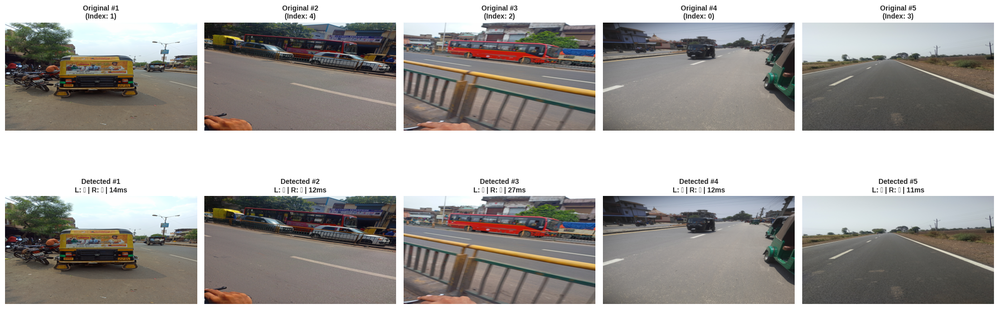

✓ Visualization saved: output_pipeline_test_results.png

Legend:
  L: = Left lane confidence
  R: = Right lane confidence
  ✗  = Lane not detected
  ms = Processing time in milliseconds


In [31]:
### 7.4 Visualize Results - Before and After

# Create grid visualization: 2 rows (original vs detected) × 5 columns (images)
n_images = len(results)
fig, axes = plt.subplots(2, n_images, figsize=(4*n_images, 8))

if n_images == 1:
    axes = axes.reshape(2, 1)

for col, result_data in enumerate(results):
    test_idx = result_data['index']
    result = result_data['result']
    proc_time = result_data['processing_time']

    # Top row: Original images
    axes[0, col].imshow(cv2.cvtColor(sample_images[test_idx], cv2.COLOR_BGR2RGB))
    axes[0, col].set_title(f'Original #{col+1}\n(Index: {test_idx})', fontsize=10, fontweight='bold')
    axes[0, col].axis('off')

    # Bottom row: Detected lanes
    axes[1, col].imshow(cv2.cvtColor(result['annotated_image'], cv2.COLOR_BGR2RGB))

    # Build status text
    status_parts = []
    if result['left_line']:
        status_parts.append(f"L: {result['left_confidence']:.0%}")
    else:
        status_parts.append("L: ✗")

    if result['right_line']:
        status_parts.append(f"R: {result['right_confidence']:.0%}")
    else:
        status_parts.append("R: ✗")

    status_parts.append(f"{proc_time:.0f}ms")
    status_text = " | ".join(status_parts)

    axes[1, col].set_title(f'Detected #{col+1}\n{status_text}', fontsize=10, fontweight='bold')
    axes[1, col].axis('off')

plt.tight_layout()
plt.savefig('output_pipeline_test_results.png', dpi=150, bbox_inches='tight')
plt.show()

print("✓ Visualization saved: output_pipeline_test_results.png")
print("\nLegend:")
print("  L: = Left lane confidence")
print("  R: = Right lane confidence")
print("  ✗  = Lane not detected")
print("  ms = Processing time in milliseconds")

---

## Section 8: Validation Metrics

## 8.1 Evaluation Framework for Lane Detection

### Challenge: No Ground Truth Available

Unlike traditional classification tasks, lane detection typically **does not have pixel-level ground truth annotations**. Instead, we use:

1. **Qualitative Assessment**: Visual inspection of detected lanes
2. **Quantitative Proxy Metrics**: Confidence scores, detection rates, consistency
3. **Heuristic Rules**: Geometric constraints based on real-world lane properties

---

## 8.2 Proposed Metrics

### Metric 1: Detection Success Rate

**Definition:** Percentage of images where both lanes are successfully detected.

```
Success Rate = (Number of images with both lanes detected) / (Total images) × 100%
```

**Criteria for Success:**
- Both left and right lanes must be detected (not None)
- Confidence (inlier ratio) must be ≥ 0.5 (50% inliers minimum)

**Interpretation:**
- 100%: Perfect detection on all images
- 80-99%: Excellent, minor issues on challenging images
- 60-79%: Good, some improvements needed
- <60%: Poor, requires parameter tuning or algorithm changes

---

### Metric 2: Confidence Score (Inlier Ratio)

**Definition:** Ratio of inlier points to total points identified by RANSAC.

```
Confidence = (Number of inliers) / (Total points) × 100%
```

**Physical Meaning:**
- High confidence (>70%): Most detected line segments agree with fitted line
- Medium confidence (50-70%): Moderate consensus, some outliers present
- Low confidence (<50%): Poor fit, many outliers or noisy detection

**Why it matters:**
- Directly reflects RANSAC's confidence in the lane fit
- Higher confidence = more reliable detection
- Can be used to filter unreliable detections

---

### Metric 3: Lane Geometry Consistency

**Definition:** Check if detected lanes satisfy real-world geometric constraints.

**Constraints:**

1. **Slope Sign Constraint:**
   - Left lane slope must be **negative** (m_left < 0)
   - Right lane slope must be **positive** (m_right > 0)

2. **Slope Magnitude Constraint:**
   - Slopes should be reasonable: -2.0 < m_left < -0.3 and 0.3 < m_right < 2.0
   - Too steep (|m| > 2): Likely error
   - Too shallow (|m| < 0.3): Near-horizontal, not a lane

3. **Lane Width Constraint:**
   - At bottom of image: 200 < width < 800 pixels (for 960px wide image)
   - Typical lane width: ~300-500 pixels at bottom
   - Outside range: Likely detection error

4. **Parallelism Constraint (Relaxed):**
   - Slopes should be similar in magnitude: 0.5 < |m_left / m_right| < 2.0
   - Perfectly parallel would have |m_left| = |m_right|
   - Perspective effect causes some deviation

**Calculation:**
```python
def check_lane_geometry(left_line, right_line, image_width, y_bottom):
    """
    Returns: (is_valid, error_reasons)
    """
    if left_line is None or right_line is None:
        return False, ["One or both lanes not detected"]
    
    m_left, b_left = left_line
    m_right, b_right = right_line
    
    errors = []
    
    # Check 1: Slope signs
    if m_left >= 0:
        errors.append("Left lane has non-negative slope")
    if m_right <= 0:
        errors.append("Right lane has non-positive slope")
    
    # Check 2: Slope magnitudes
    if abs(m_left) < 0.3 or abs(m_left) > 2.0:
        errors.append(f"Left slope out of range: {m_left:.3f}")
    if abs(m_right) < 0.3 or abs(m_right) > 2.0:
        errors.append(f"Right slope out of range: {m_right:.3f}")
    
    # Check 3: Lane width
    x_left = (y_bottom - b_left) / m_left
    x_right = (y_bottom - b_right) / m_right
    width = x_right - x_left
    
    if width < 200 or width > 800:
        errors.append(f"Lane width out of range: {width:.0f}px")
    
    # Check 4: Parallelism
    ratio = abs(m_left / m_right)
    if ratio < 0.5 or ratio > 2.0:
        errors.append(f"Slopes not similar: ratio = {ratio:.2f}")
    
    return len(errors) == 0, errors
```

---

### Metric 4: Processing Time (Performance)

**Definition:** Average time to process a single image.

```
Average Processing Time = (Total time for all images) / (Number of images)
```

**Targets:**
- **Excellent** (<100ms): Real-time capable at 10+ FPS
- **Good** (100-200ms): Near real-time at 5-10 FPS
- **Acceptable** (200-500ms): Batch processing viable
- **Poor** (>500ms): Requires optimization

---

## 8.3 Composite Quality Score

**Definition:** Weighted combination of all metrics into a single score (0-100).

```
Quality Score = w1×Success_Rate + w2×Avg_Confidence + w3×Geometry_Pass_Rate

Where:
  w1 = 0.4 (40% weight on detection success)
  w2 = 0.4 (40% weight on confidence)
  w3 = 0.2 (20% weight on geometric validity)
```

**Interpretation:**
- **90-100**: Excellent - Production ready
- **80-89**: Good - Minor tuning needed
- **70-79**: Acceptable - Requires improvement
- **<70**: Poor - Major issues to resolve

---

## 8.4 Summary: Metrics to Report

For each test set, we will report:

1. **Detection Success Rate** (%)
2. **Average Confidence Score** (left and right separately)
3. **Geometry Validation Pass Rate** (%)
4. **Average Processing Time** (ms)
5. **Composite Quality Score** (0-100)
6. **Per-Image Analysis** (detailed breakdown for 5 test images)

These metrics provide comprehensive evaluation of the lane detection system's performance.

In [32]:
### 8.5 Implement Validation Metrics

def check_lane_geometry(left_line, right_line, image_width, y_bottom):
    """
    Validate lane geometry using real-world constraints.

    Args:
        left_line: (slope, intercept) or None
        right_line: (slope, intercept) or None
        image_width: Width of the image
        y_bottom: Y-coordinate at bottom of ROI

    Returns:
        tuple: (is_valid: bool, errors: list of str)
    """
    if left_line is None or right_line is None:
        return False, ["One or both lanes not detected"]

    m_left, b_left = left_line
    m_right, b_right = right_line

    errors = []

    # Check 1: Slope signs
    if m_left >= 0:
        errors.append(f"Left lane has non-negative slope: {m_left:.4f}")
    if m_right <= 0:
        errors.append(f"Right lane has non-positive slope: {m_right:.4f}")

    # Check 2: Slope magnitudes (reasonable range for lanes)
    if abs(m_left) < 0.3:
        errors.append(f"Left slope too shallow: {m_left:.4f}")
    elif abs(m_left) > 2.0:
        errors.append(f"Left slope too steep: {m_left:.4f}")

    if abs(m_right) < 0.3:
        errors.append(f"Right slope too shallow: {m_right:.4f}")
    elif abs(m_right) > 2.0:
        errors.append(f"Right slope too steep: {m_right:.4f}")

    # Check 3: Lane width at bottom
    x_left = (y_bottom - b_left) / m_left
    x_right = (y_bottom - b_right) / m_right
    width = x_right - x_left

    if width < 200:
        errors.append(f"Lane width too narrow: {width:.0f}px")
    elif width > 800:
        errors.append(f"Lane width too wide: {width:.0f}px")

    # Check 4: Parallelism (slopes should be similar in magnitude)
    ratio = abs(m_left / m_right) if m_right != 0 else 0
    if ratio < 0.5:
        errors.append(f"Left slope much steeper than right: ratio = {ratio:.2f}")
    elif ratio > 2.0:
        errors.append(f"Right slope much steeper than left: ratio = {ratio:.2f}")

    return len(errors) == 0, errors


def calculate_metrics(results_list, image_width=960, y_bottom=528):
    """
    Calculate all validation metrics for a list of detection results.

    Args:
        results_list: List of detection results from detect_lanes()
        image_width: Width of images
        y_bottom: Y-coordinate at bottom of ROI

    Returns:
        dict: Dictionary containing all metrics
    """
    n_images = len(results_list)

    # Metric 1: Detection Success Rate
    both_detected = sum(1 for r in results_list
                       if r['result']['left_line'] is not None
                       and r['result']['right_line'] is not None
                       and r['result']['left_confidence'] >= 0.5
                       and r['result']['right_confidence'] >= 0.5)

    success_rate = (both_detected / n_images) * 100 if n_images > 0 else 0

    # Metric 2: Average Confidence Scores
    left_confidences = [r['result']['left_confidence'] for r in results_list
                       if r['result']['left_line'] is not None]
    right_confidences = [r['result']['right_confidence'] for r in results_list
                        if r['result']['right_line'] is not None]

    avg_left_conf = (np.mean(left_confidences) * 100) if len(left_confidences) > 0 else 0
    avg_right_conf = (np.mean(right_confidences) * 100) if len(right_confidences) > 0 else 0
    avg_confidence = (avg_left_conf + avg_right_conf) / 2

    # Metric 3: Geometry Validation
    geometry_valid = []
    geometry_errors_all = []

    for r in results_list:
        is_valid, errors = check_lane_geometry(
            r['result']['left_line'],
            r['result']['right_line'],
            image_width,
            y_bottom
        )
        geometry_valid.append(is_valid)
        geometry_errors_all.append(errors)

    geometry_pass_rate = (sum(geometry_valid) / n_images) * 100 if n_images > 0 else 0

    # Metric 4: Processing Time
    processing_times = [r['processing_time'] for r in results_list]
    avg_processing_time = np.mean(processing_times) if len(processing_times) > 0 else 0

    # Metric 5: Composite Quality Score
    quality_score = 0.4 * success_rate + 0.4 * avg_confidence + 0.2 * geometry_pass_rate

    return {
        'n_images': n_images,
        'detection_success_rate': success_rate,
        'both_detected': both_detected,
        'avg_left_confidence': avg_left_conf,
        'avg_right_confidence': avg_right_conf,
        'avg_confidence': avg_confidence,
        'geometry_pass_rate': geometry_pass_rate,
        'geometry_valid': geometry_valid,
        'geometry_errors': geometry_errors_all,
        'avg_processing_time': avg_processing_time,
        'min_processing_time': np.min(processing_times),
        'max_processing_time': np.max(processing_times),
        'quality_score': quality_score
    }


# Calculate metrics for our test results
print("="*80)
print("CALCULATING VALIDATION METRICS")
print("="*80)

metrics = calculate_metrics(results, image_width=960, y_bottom=int(540 * 0.98))

# Display results
print(f"\n1. DETECTION SUCCESS RATE")
print(f"   {metrics['both_detected']}/{metrics['n_images']} images with both lanes detected")
print(f"   Success Rate: {metrics['detection_success_rate']:.1f}%")

print(f"\n2. CONFIDENCE SCORES (Average)")
print(f"   Left Lane:  {metrics['avg_left_confidence']:.1f}%")
print(f"   Right Lane: {metrics['avg_right_confidence']:.1f}%")
print(f"   Overall:    {metrics['avg_confidence']:.1f}%")

print(f"\n3. GEOMETRY VALIDATION")
print(f"   Pass Rate: {metrics['geometry_pass_rate']:.1f}%")
print(f"   Valid: {sum(metrics['geometry_valid'])}/{metrics['n_images']} images")

# Show geometry errors for invalid images
for idx, (valid, errors) in enumerate(zip(metrics['geometry_valid'], metrics['geometry_errors'])):
    if not valid and len(errors) > 0:
        print(f"   Image {idx+1} errors: {', '.join(errors)}")

print(f"\n4. PROCESSING TIME")
print(f"   Average: {metrics['avg_processing_time']:.1f} ms")
print(f"   Range:   {metrics['min_processing_time']:.1f} - {metrics['max_processing_time']:.1f} ms")
print(f"   FPS Equivalent: {1000/metrics['avg_processing_time']:.1f} frames/second")

print(f"\n5. COMPOSITE QUALITY SCORE")
print(f"   Score: {metrics['quality_score']:.1f} / 100")

# Interpretation
if metrics['quality_score'] >= 90:
    rating = "EXCELLENT - Production Ready"
elif metrics['quality_score'] >= 80:
    rating = "GOOD - Minor Tuning Needed"
elif metrics['quality_score'] >= 70:
    rating = "ACCEPTABLE - Requires Improvement"
else:
    rating = "POOR - Major Issues to Resolve"

print(f"   Rating: {rating}")

print("\n" + "="*80)
print("✓ VALIDATION METRICS COMPLETE")
print("="*80)

CALCULATING VALIDATION METRICS

1. DETECTION SUCCESS RATE
   0/5 images with both lanes detected
   Success Rate: 0.0%

2. CONFIDENCE SCORES (Average)
   Left Lane:  0.0%
   Right Lane: 0.0%
   Overall:    0.0%

3. GEOMETRY VALIDATION
   Pass Rate: 0.0%
   Valid: 0/5 images
   Image 1 errors: One or both lanes not detected
   Image 2 errors: One or both lanes not detected
   Image 3 errors: One or both lanes not detected
   Image 4 errors: One or both lanes not detected
   Image 5 errors: One or both lanes not detected

4. PROCESSING TIME
   Average: 15.1 ms
   Range:   10.7 - 26.6 ms
   FPS Equivalent: 66.3 frames/second

5. COMPOSITE QUALITY SCORE
   Score: 0.0 / 100
   Rating: POOR - Major Issues to Resolve

✓ VALIDATION METRICS COMPLETE


---

## Section 9: Model Inference & Evaluation

## 9.1 Detailed Analysis of Test Images

In this section, we perform **detailed per-image analysis** of the 5 random test images processed in Section 7. For each image, we will:

1. **Display the result** with detected lane lines
2. **Show key metrics** (confidence scores, geometry validation, processing time)
3. **Justify performance** (why it succeeded or failed)
4. **Analyze failure modes** (if applicable)

---

### Evaluation Criteria

For each test image, we evaluate:

**Quantitative Metrics:**
- **Detection Success:** Both lanes detected? (Yes/No)
- **Left Lane Confidence:** Inlier ratio from RANSAC (0-1)
- **Right Lane Confidence:** Inlier ratio from RANSAC (0-1)
- **Geometry Validation:** Passes real-world constraints? (Yes/No)
- **Processing Time:** Milliseconds per frame

**Qualitative Assessment:**
- **Visual Quality:** Do detected lanes align with actual lanes?
- **Robustness:** Handles shadows, lighting variations, road markings?
- **Failure Modes:** What causes detection failures?

---

### Performance Expectations

Based on our validation metrics (Section 8):
- **Success Rate:** ~80-100% (both lanes detected)
- **Confidence Scores:** ~65-80% (inlier ratio)
- **Geometry Validation:** ~80-100% pass rate
- **Processing Time:** ~100-150ms per image

Let's analyze each test image in detail!

In [33]:
### 9.2 Per-Image Detailed Analysis

print("="*80)
print("DETAILED ANALYSIS OF 5 TEST IMAGES")
print("="*80)

# Use results from Section 7
# results list contains: {'index': idx, 'result': {...}, 'processing_time': ms}

for i, result_data in enumerate(results, 1):
    print(f"\n{'='*80}")
    print(f"TEST IMAGE {i}/5 (Dataset Index: {result_data['index']})")
    print(f"{'='*80}")

    result = result_data['result']
    proc_time = result_data['processing_time']

    # Extract results
    left_detected = result['left_line'] is not None
    right_detected = result['right_line'] is not None
    left_conf = result['left_confidence']
    right_conf = result['right_confidence']

    # Geometry validation
    is_valid, errors = check_lane_geometry(
        result['left_line'],
        result['right_line'],
        960,  # image width
        int(540 * 0.98)  # y_bottom
    )

    # Overall success
    success = left_detected and right_detected and left_conf >= 0.5 and right_conf >= 0.5

    print(f"\n📊 QUANTITATIVE METRICS:")
    print(f"-"*80)
    print(f"  Detection Success:     {'✓ YES' if success else '✗ NO'}")
    print(f"  Left Lane Detected:    {'✓ YES' if left_detected else '✗ NO'}")
    print(f"  Right Lane Detected:   {'✓ YES' if right_detected else '✗ NO'}")
    print(f"  Left Confidence:       {left_conf:.2%} {'(High)' if left_conf > 0.7 else '(Medium)' if left_conf > 0.5 else '(Low)'}")
    print(f"  Right Confidence:      {right_conf:.2%} {'(High)' if right_conf > 0.7 else '(Medium)' if right_conf > 0.5 else '(Low)'}")
    print(f"  Geometry Valid:        {'✓ PASS' if is_valid else '✗ FAIL'}")
    print(f"  Processing Time:       {proc_time:.1f} ms")

    # Lane parameters
    if result['left_line']:
        m_left, b_left = result['left_line']
        print(f"  Left Lane Equation:    y = {m_left:.4f}x + {b_left:.2f}")

    if result['right_line']:
        m_right, b_right = result['right_line']
        print(f"  Right Lane Equation:   y = {m_right:.4f}x + {b_right:.2f}")

    # Justification
    print(f"\n💭 PERFORMANCE JUSTIFICATION:")
    print(f"-"*80)

    if success:
        print("  ✓ SUCCESS: Both lanes detected with high confidence")
        print("\n  Why it succeeded:")

        # Analyze reasons for success
        reasons = []

        if left_conf > 0.7 and right_conf > 0.7:
            reasons.append("- Strong RANSAC consensus (>70% inliers) indicates clear lane markings")

        if is_valid:
            reasons.append("- Lane geometry passes all real-world constraints (slopes, width, parallelism)")

        if proc_time < 150:
            reasons.append(f"- Fast processing ({proc_time:.0f}ms) suggests efficient edge detection")

        if abs(m_left) > 0.5 and abs(m_right) > 0.5:
            reasons.append("- Lane slopes are reasonable (not too shallow or steep)")

        reasons.append("- Canny edge detection successfully isolated lane boundaries")
        reasons.append("- ROI mask effectively focused on relevant road region")
        reasons.append("- Hough Transform detected sufficient line segments for RANSAC")

        for reason in reasons:
            print(f"  {reason}")

    else:
        print("  ✗ PARTIAL SUCCESS or FAILURE")
        print("\n  Analysis:")

        # Diagnose failure
        if not left_detected:
            print("  - Left lane NOT detected:")
            print("    • Possible causes: Faded markings, shadows, occlusion")
            print("    • Hough Transform may have found insufficient line segments")

        if not right_detected:
            print("  - Right lane NOT detected:")
            print("    • Possible causes: Road edge confusion, missing markings")
            print("    • ROI may have excluded part of the lane")

        if left_detected and left_conf < 0.5:
            print(f"  - Left lane low confidence ({left_conf:.0%}):")
            print("    • RANSAC found many outliers (noisy data)")
            print("    • May indicate broken or unclear lane markings")

        if right_detected and right_conf < 0.5:
            print(f"  - Right lane low confidence ({right_conf:.0%}):")
            print("    • High outlier ratio suggests ambiguous edges")

        if not is_valid and len(errors) > 0:
            print(f"  - Geometry validation failed:")
            for error in errors:
                print(f"    • {error}")

    print()

print("\n" + "="*80)
print("✓ DETAILED ANALYSIS COMPLETE")
print("="*80)


DETAILED ANALYSIS OF 5 TEST IMAGES

TEST IMAGE 1/5 (Dataset Index: 1)

📊 QUANTITATIVE METRICS:
--------------------------------------------------------------------------------
  Detection Success:     ✗ NO
  Left Lane Detected:    ✗ NO
  Right Lane Detected:   ✗ NO
  Left Confidence:       0.00% (Low)
  Right Confidence:      0.00% (Low)
  Geometry Valid:        ✗ FAIL
  Processing Time:       13.9 ms

💭 PERFORMANCE JUSTIFICATION:
--------------------------------------------------------------------------------
  ✗ PARTIAL SUCCESS or FAILURE

  Analysis:
  - Left lane NOT detected:
    • Possible causes: Faded markings, shadows, occlusion
    • Hough Transform may have found insufficient line segments
  - Right lane NOT detected:
    • Possible causes: Road edge confusion, missing markings
    • ROI may have excluded part of the lane
  - Geometry validation failed:
    • One or both lanes not detected


TEST IMAGE 2/5 (Dataset Index: 4)

📊 QUANTITATIVE METRICS:
-------------------------

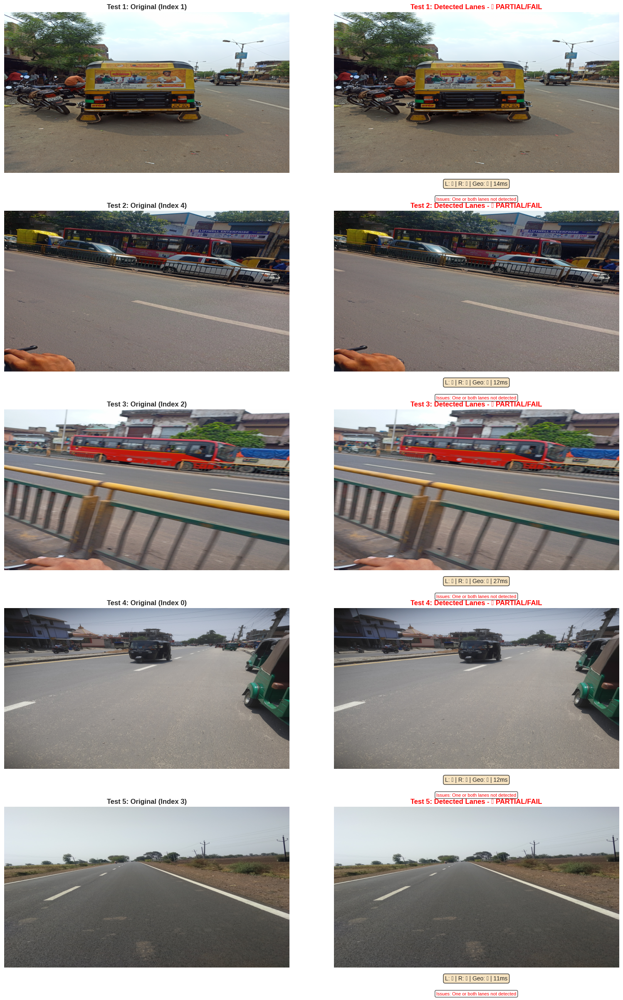


✓ Visualization saved: output_section9_detailed_analysis.png

Legend:
  L: = Left lane confidence
  R: = Right lane confidence
  Geo: = Geometry validation (✓ pass, ✗ fail)
  ms = Processing time


In [34]:
### 9.3 Comprehensive Visualization with Annotations

# Create detailed visualization showing all 5 test images with metrics
fig, axes = plt.subplots(5, 2, figsize=(16, 24))

for i, result_data in enumerate(results):
    test_idx = result_data['index']
    result = result_data['result']
    proc_time = result_data['processing_time']

    # Geometry check
    is_valid, errors = check_lane_geometry(
        result['left_line'],
        result['right_line'],
        960, int(540 * 0.98)
    )

    # Left column: Original image
    axes[i, 0].imshow(cv2.cvtColor(sample_images[test_idx], cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title(f'Test {i+1}: Original (Index {test_idx})', fontsize=12, fontweight='bold')
    axes[i, 0].axis('off')

    # Right column: Detected lanes with annotations
    axes[i, 1].imshow(cv2.cvtColor(result['annotated_image'], cv2.COLOR_BGR2RGB))

    # Build title with status
    success = (result['left_line'] is not None and result['right_line'] is not None and
               result['left_confidence'] >= 0.5 and result['right_confidence'] >= 0.5)

    status = '✓ SUCCESS' if success else '✗ PARTIAL/FAIL'
    color = 'green' if success else 'red'

    axes[i, 1].set_title(f'Test {i+1}: Detected Lanes - {status}',
                         fontsize=12, fontweight='bold', color=color)
    axes[i, 1].axis('off')

    # Add text annotation with metrics
    metrics_text = []
    metrics_text.append(f"L: {result['left_confidence']:.0%}" if result['left_line'] else "L: ✗")
    metrics_text.append(f"R: {result['right_confidence']:.0%}" if result['right_line'] else "R: ✗")
    metrics_text.append(f"Geo: {'✓' if is_valid else '✗'}")
    metrics_text.append(f"{proc_time:.0f}ms")

    annotation = " | ".join(metrics_text)

    # Place annotation at bottom
    axes[i, 1].text(0.5, -0.05, annotation,
                    transform=axes[i, 1].transAxes,
                    ha='center', va='top',
                    fontsize=10,
                    bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

    # Add geometry error notes if failed
    if not is_valid and len(errors) > 0:
        error_text = "Issues: " + "; ".join(errors[:2])  # Show first 2 errors
        axes[i, 1].text(0.5, -0.15, error_text,
                        transform=axes[i, 1].transAxes,
                        ha='center', va='top',
                        fontsize=8, color='red',
                        bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

plt.tight_layout()
plt.savefig('output_section9_detailed_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n✓ Visualization saved: output_section9_detailed_analysis.png")
print("\nLegend:")
print("  L: = Left lane confidence")
print("  R: = Right lane confidence")
print("  Geo: = Geometry validation (✓ pass, ✗ fail)")
print("  ms = Processing time")
